In [1]:
import os
import re
from os.path import join

import sympy
from sympy import Symbol, sqrt, cos, pi, symbols
import numpy as np
import matplotlib.pylab as plt
import pandas as pd
from collections import OrderedDict

import qnet
from qnet.algebra import *

import QDYN

from src.notebook_plots_v1 import plot_bs_decay, display_hamiltonian, display_eq, show_summary_dicke
from src.single_sided_network_v1 import network_slh
from src.dicke_single_model_v2 import write_dicke_single_model, err_dicke_single
from src.doit_actions_v1 import run_traj_prop

from doit.tools import register_doit_as_IPython_magic

In [2]:
qnet.init_printing()

In [3]:
DOIT_CONFIG = {
    'backend': 'json',
    'dep_file': '.doit_db/2017-06-01_mg_dicke1_QSL_traj1-analysis.json',
}
register_doit_as_IPython_magic()

$
\newcommand{ket}[1]{\vert #1 \rangle}
\newcommand{bra}[1]{\langle #1 \vert}
\newcommand{Op}[1]{\hat{#1}}
$

# Analysis: QSL for Single-Excitation Dicke state

## collect runfolders

In [4]:
DATA_ROOT = './data/dicke1_QSL_nonherm'

In [5]:
RX_LEAFFOLDER = re.compile(r'rf_(?P<nodes>\d+)nodes_T(?P<T>[\d_]+)')

In [6]:
def collect_runfolders(data_root):
    runfolders = []
    for dirpath, dirnames, filenames in os.walk(data_root):
        if not dirnames:
            if RX_LEAFFOLDER.match(os.path.split(dirpath)[-1]):
                runfolders.append(dirpath)
            else:
                print(
                    "%s does not match %s" % (dirpath, rx_leaffolder.pattern))
    return runfolders

In [7]:
RUNFOLDERS = collect_runfolders(DATA_ROOT)

## Propagation (doit task)

In [8]:
def task_propagate():
    """Run optimization for every runfolder from params_df"""
    jobs = {}
    for rf in RUNFOLDERS:
        yield {
            'name': str(rf),
            'actions': [
                (run_traj_prop, [rf, ], dict(n_trajs=1))],
            'file_dep': [join(rf, 'pulse1.oct.dat'),],
            'targets': [join(rf, 'state_final.dat.1'),]}

In [9]:
%doit propagate

-- propagate:./data/dicke1_QSL_nonherm/rf_3nodes_T1
-- propagate:./data/dicke1_QSL_nonherm/rf_4nodes_T20
.  propagate:./data/dicke1_QSL_nonherm/rf_5nodes_T5
-- propagate:./data/dicke1_QSL_nonherm/rf_2nodes_T2_25
-- propagate:./data/dicke1_QSL_nonherm/rf_4nodes_T2
-- propagate:./data/dicke1_QSL_nonherm/rf_2nodes_T1_40
-- propagate:./data/dicke1_QSL_nonherm/rf_4nodes_T50
.  propagate:./data/dicke1_QSL_nonherm/rf_5nodes_T3
.  propagate:./data/dicke1_QSL_nonherm/rf_5nodes_T0_50
.  propagate:./data/dicke1_QSL_nonherm/rf_4nodes_T3
-- propagate:./data/dicke1_QSL_nonherm/rf_3nodes_T1_40
-- propagate:./data/dicke1_QSL_nonherm/rf_4nodes_T5
.  propagate:./data/dicke1_QSL_nonherm/rf_6nodes_T6
-- propagate:./data/dicke1_QSL_nonherm/rf_6nodes_T18
-- propagate:./data/dicke1_QSL_nonherm/rf_2nodes_T1_30
.  propagate:./data/dicke1_QSL_nonherm/rf_4nodes_T4
-- propagate:./data/dicke1_QSL_nonherm/rf_6nodes_T15
-- propagate:./data/dicke1_QSL_nonherm/rf_6nodes_T0_50
.  propagate:./data/dicke1_QSL_nonherm/rf_

.  propagate:./data/dicke1_QSL_nonherm/rf_5nodes_T50
.  propagate:./data/dicke1_QSL_nonherm/rf_3nodes_T1_80
.  propagate:./data/dicke1_QSL_nonherm/rf_6nodes_T12
.  propagate:./data/dicke1_QSL_nonherm/rf_6nodes_T14
.  propagate:./data/dicke1_QSL_nonherm/rf_4nodes_T7
.  propagate:./data/dicke1_QSL_nonherm/rf_2nodes_T10


## Error Collection

In [10]:
def collect_table(runfolders):
    n_nodes = []
    T = []
    iters = []
    err = []
    for rf in runfolders:
        m = RX_LEAFFOLDER.match(os.path.split(rf)[-1])
        n_nodes.append(int(m.group('nodes')))
        T.append(float(m.group('T').replace('_', '.')))
        pulse = QDYN.pulse.Pulse.read(join(rf, 'pulse1.oct.dat'))
        iters.append(pulse.oct_iter)
        err.append(err_dicke_single(
            rf, final_states_glob='state_final.dat*', rho=False))
    return pd.DataFrame(
        OrderedDict([
            ('n_nodes', n_nodes), ('T', T), ('iters', iters), ('err', err),
            ('rf', runfolders)])
    ).sort_values(['n_nodes', 'T']).reset_index(drop=True)

In [11]:
TABLE = collect_table(RUNFOLDERS)

In [12]:
print(TABLE.to_string())

     n_nodes      T  iters           err                                         rf
0          2   0.50  15000  9.095337e-02  ./data/dicke1_QSL_nonherm/rf_2nodes_T0_50
1          2   1.00  30000  6.392398e-03     ./data/dicke1_QSL_nonherm/rf_2nodes_T1
2          2   1.10  30000  3.920090e-03  ./data/dicke1_QSL_nonherm/rf_2nodes_T1_10
3          2   1.20  30000  2.401964e-03  ./data/dicke1_QSL_nonherm/rf_2nodes_T1_20
4          2   1.25  30000  1.861410e-03  ./data/dicke1_QSL_nonherm/rf_2nodes_T1_25
5          2   1.30  30000  5.137660e-02  ./data/dicke1_QSL_nonherm/rf_2nodes_T1_30
6          2   1.40  30000  8.692790e-04  ./data/dicke1_QSL_nonherm/rf_2nodes_T1_40
7          2   1.50  30000  5.137929e-04  ./data/dicke1_QSL_nonherm/rf_2nodes_T1_50
8          2   1.60  30000  2.934902e-04  ./data/dicke1_QSL_nonherm/rf_2nodes_T1_60
9          2   1.75  30000  1.175129e-04  ./data/dicke1_QSL_nonherm/rf_2nodes_T1_75
10         2   1.80  30000  8.562940e-05  ./data/dicke1_QSL_nonherm/rf_2node

In [13]:
with open("./QSL_traj1-analysis.csv", 'w') as out_fh:
    out_fh.write("# output table from 2017-06-01_mg_dicke1_QSL_traj1-analysis.ipynb\n")
    TABLE.to_csv(out_fh, index=False)

In [14]:
def ensure_monotonicity(table):
    """Drop rows in which error does not monotonically decrease"""
    while True:
        monotonic = table['err'].diff().fillna(-1) < 0
        if monotonic.all():
            break
        table = table[monotonic]
    return table

In [36]:
def plot_error(
        table, show=True, floor=1e-5, grid=False, monotonic=True,
        n_nodes_values=None, exclude=None):
    """Summary plot"""
    from mgplottools.mpl import set_axis
    fig = plt.figure(figsize=(10,6))
    ax = fig.add_subplot(111)
    if n_nodes_values is None:
        n_nodes_values = list(table['n_nodes'].unique())
    if exclude is not None:
        for n_nodes in exclude:
            try:
                n_nodes_values.remove(n_nodes)
            except ValueError:
                pass # don't care of n_nodes is not in list
    for n_nodes in n_nodes_values:
        sub_table = table[table['n_nodes'] == n_nodes]
        if monotonic:
            sub_table = ensure_monotonicity(sub_table)
        ax.plot(sub_table['T'], sub_table['err'].clip(floor, 1),
                'o-', label=str(n_nodes))
    ax.set_xlabel("time (dimensionless units)")
    ax.set_ylabel("error")
    ax.set_yscale('log')
    set_axis(ax, 'x', 0, 6, 0.5, minor=5)
    if grid:
        ax.grid()#which='both')
    ax.legend()
    if show:
        plt.show(fig)
    else:
        return fig

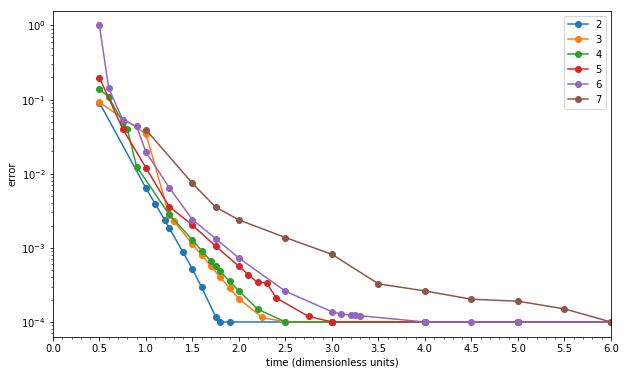

In [37]:
plot_error(TABLE, grid=False, floor=1e-4, monotonic=True, exclude=[8, ])

## pulses and dynamics

./data/dicke1_QSL_nonherm/rf_2nodes_T0_50


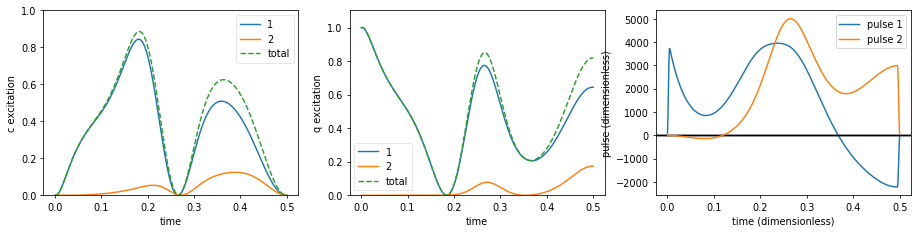

./data/dicke1_QSL_nonherm/rf_2nodes_T1


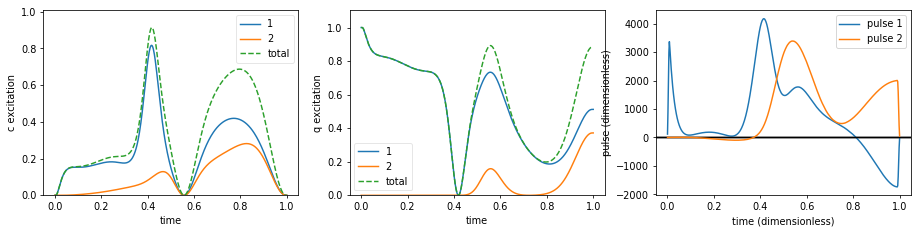

./data/dicke1_QSL_nonherm/rf_2nodes_T1_10


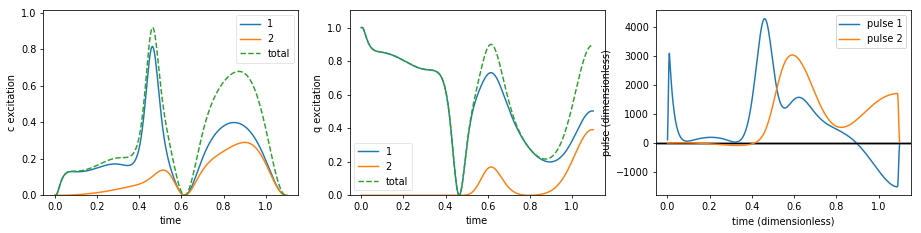

./data/dicke1_QSL_nonherm/rf_2nodes_T1_20


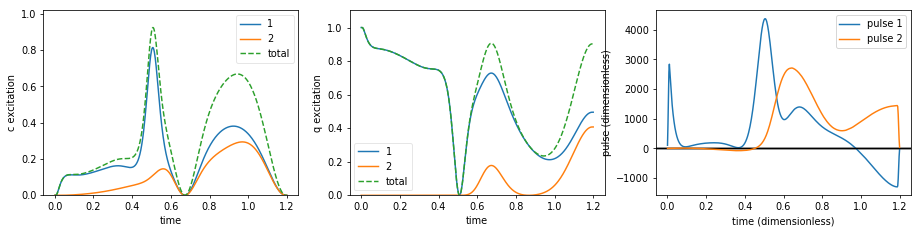

./data/dicke1_QSL_nonherm/rf_2nodes_T1_25


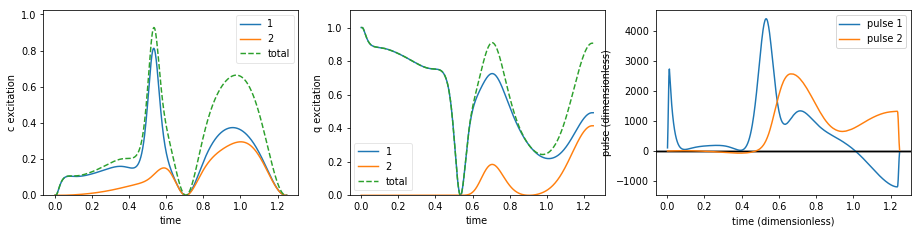

./data/dicke1_QSL_nonherm/rf_2nodes_T1_30


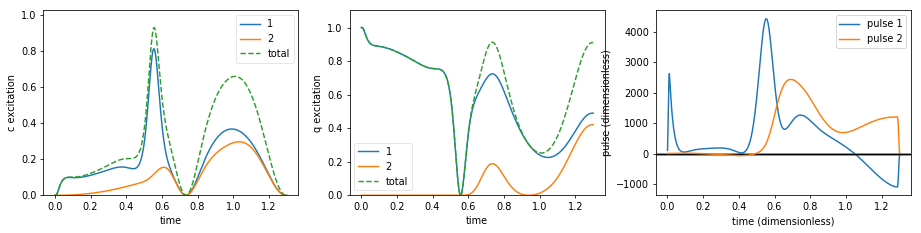

./data/dicke1_QSL_nonherm/rf_2nodes_T1_40


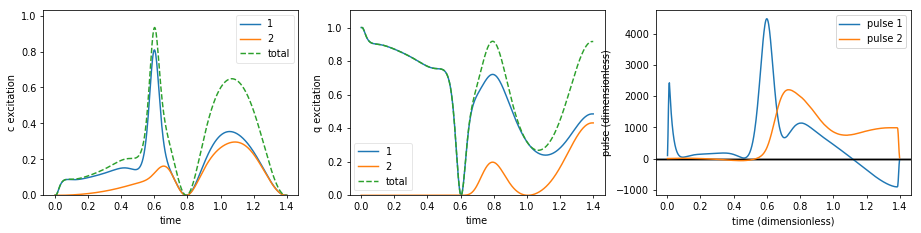

./data/dicke1_QSL_nonherm/rf_2nodes_T1_50


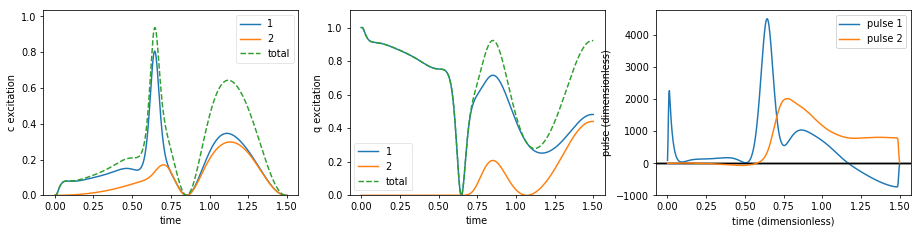

./data/dicke1_QSL_nonherm/rf_2nodes_T1_60


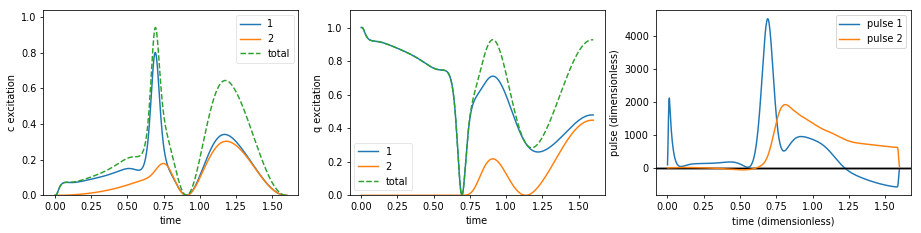

./data/dicke1_QSL_nonherm/rf_2nodes_T1_75


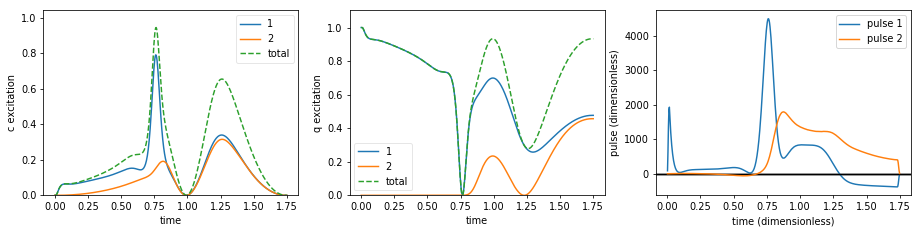

./data/dicke1_QSL_nonherm/rf_2nodes_T1_80


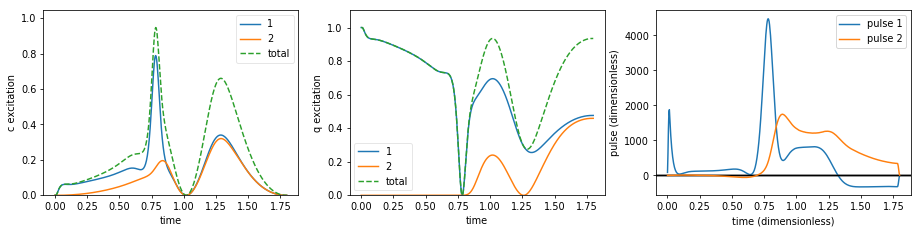

./data/dicke1_QSL_nonherm/rf_2nodes_T1_90


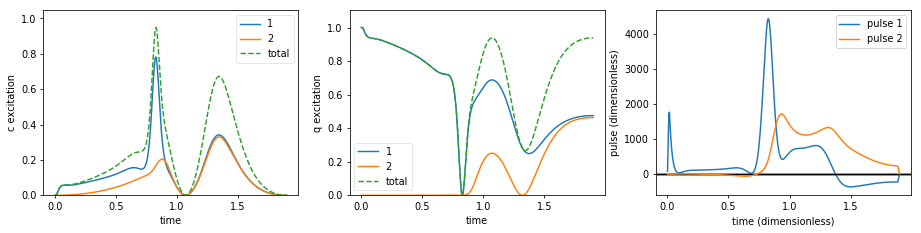

./data/dicke1_QSL_nonherm/rf_2nodes_T2


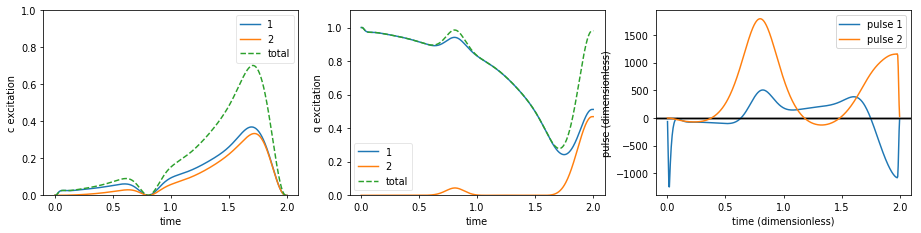

./data/dicke1_QSL_nonherm/rf_2nodes_T2_10


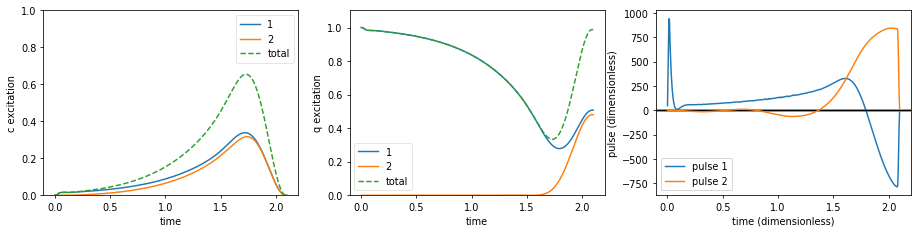

./data/dicke1_QSL_nonherm/rf_2nodes_T2_20


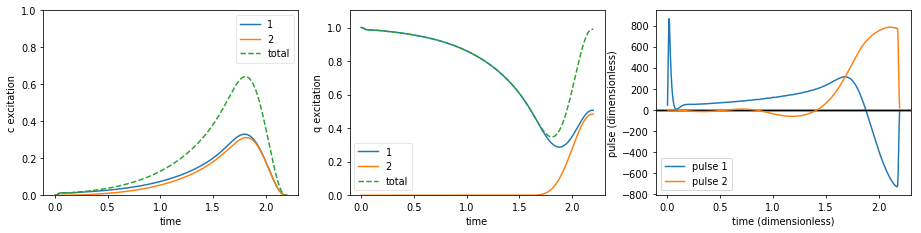

./data/dicke1_QSL_nonherm/rf_2nodes_T2_25


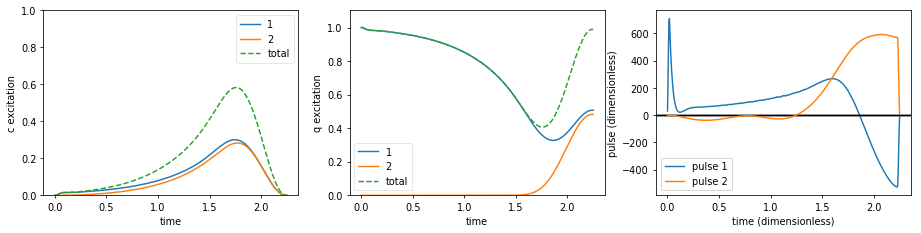

./data/dicke1_QSL_nonherm/rf_2nodes_T2_30


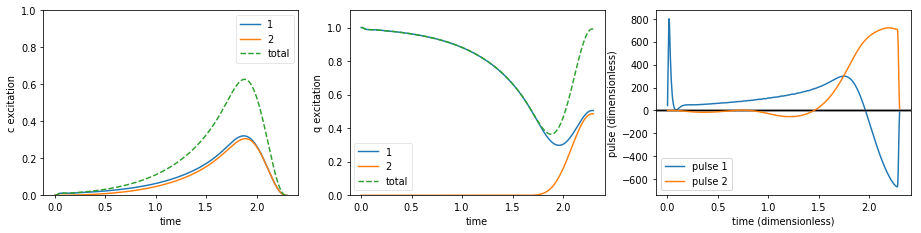

./data/dicke1_QSL_nonherm/rf_2nodes_T2_50


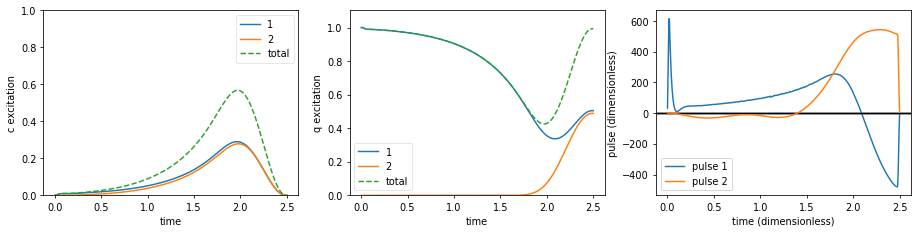

./data/dicke1_QSL_nonherm/rf_2nodes_T3


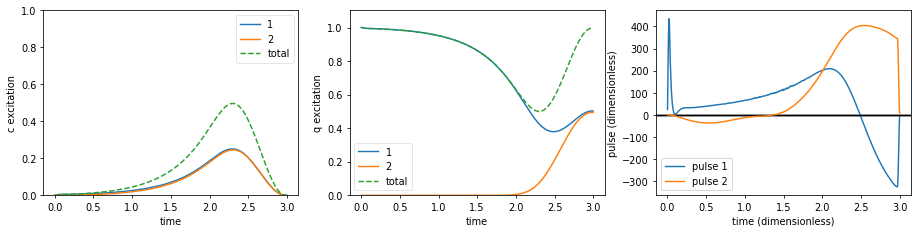

./data/dicke1_QSL_nonherm/rf_2nodes_T4


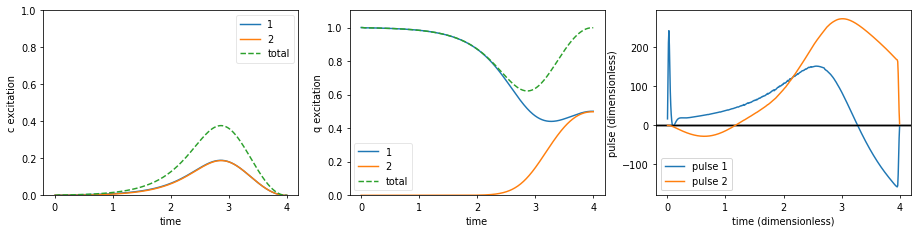

./data/dicke1_QSL_nonherm/rf_2nodes_T5


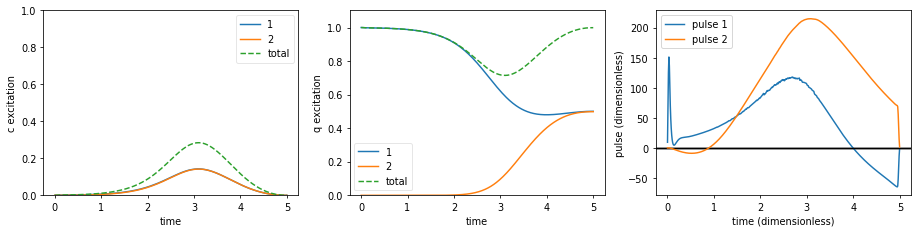

./data/dicke1_QSL_nonherm/rf_2nodes_T7


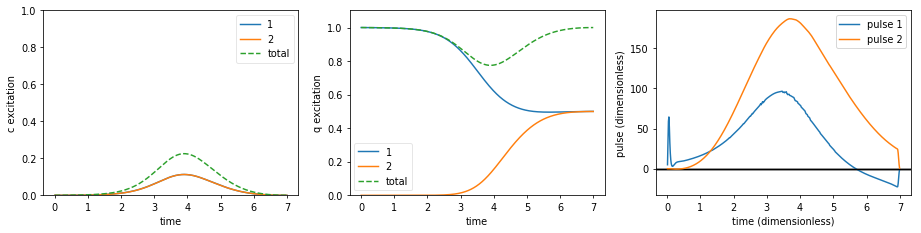

./data/dicke1_QSL_nonherm/rf_2nodes_T10


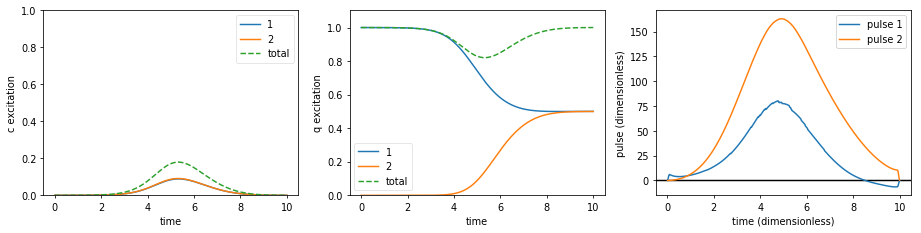

./data/dicke1_QSL_nonherm/rf_2nodes_T20


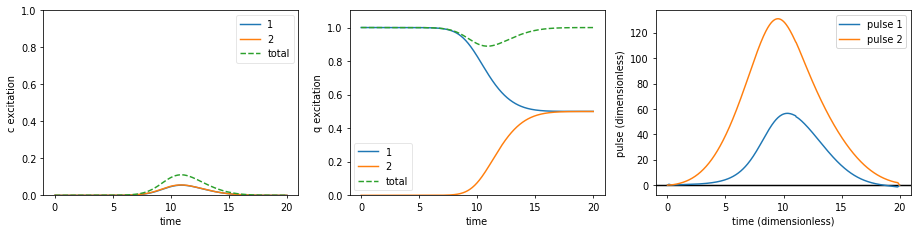

./data/dicke1_QSL_nonherm/rf_2nodes_T50


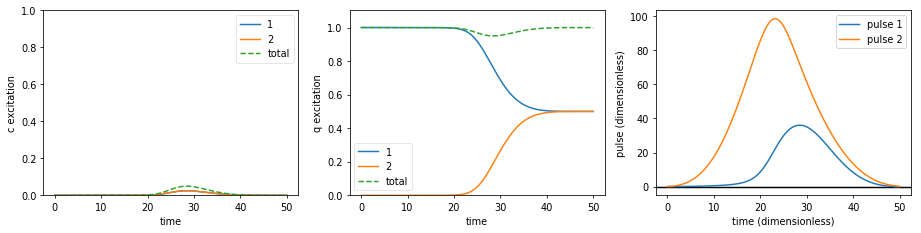

./data/dicke1_QSL_nonherm/rf_2nodes_T70


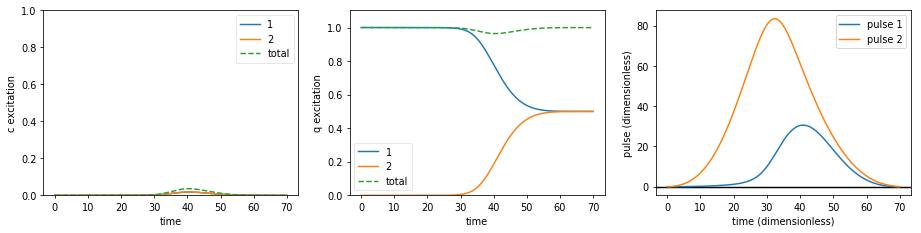

./data/dicke1_QSL_nonherm/rf_3nodes_T0_50


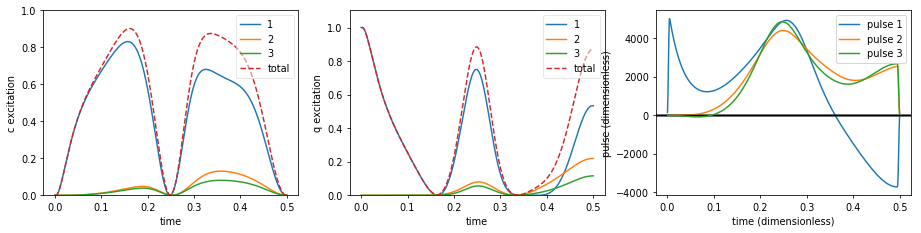

./data/dicke1_QSL_nonherm/rf_3nodes_T1


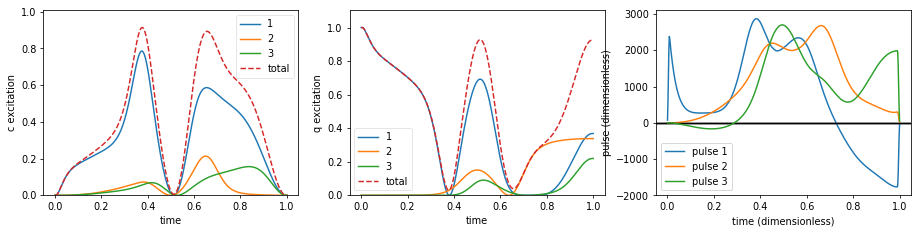

./data/dicke1_QSL_nonherm/rf_3nodes_T1_25


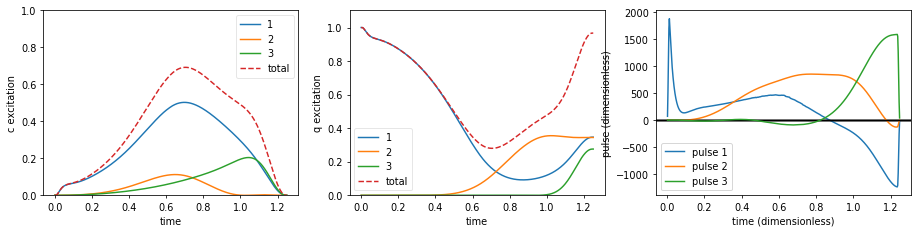

./data/dicke1_QSL_nonherm/rf_3nodes_T1_30


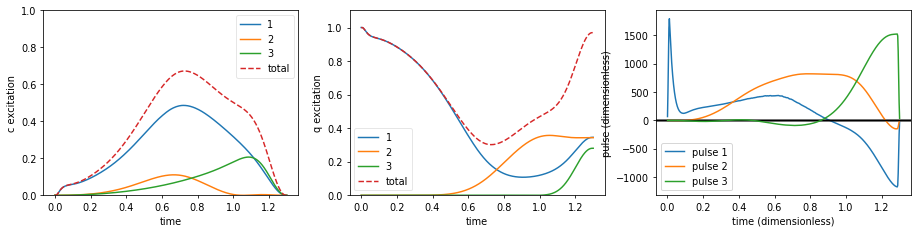

./data/dicke1_QSL_nonherm/rf_3nodes_T1_40


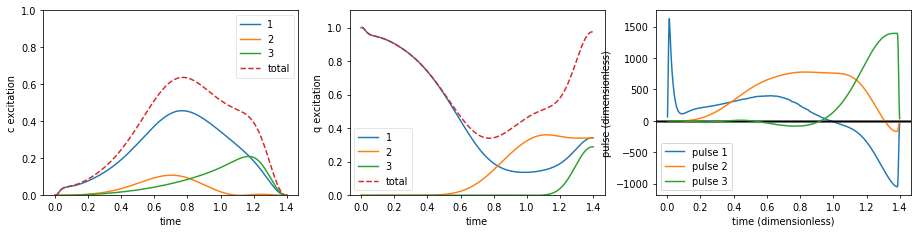

./data/dicke1_QSL_nonherm/rf_3nodes_T1_50


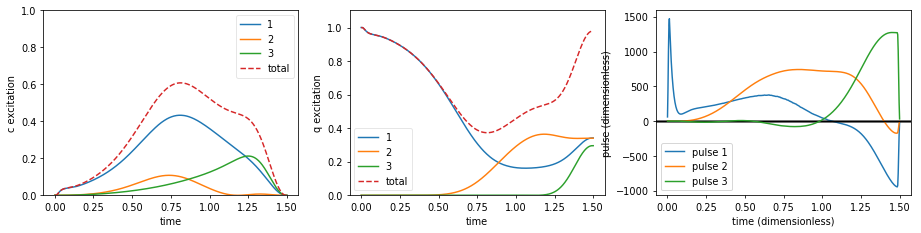

./data/dicke1_QSL_nonherm/rf_3nodes_T1_60


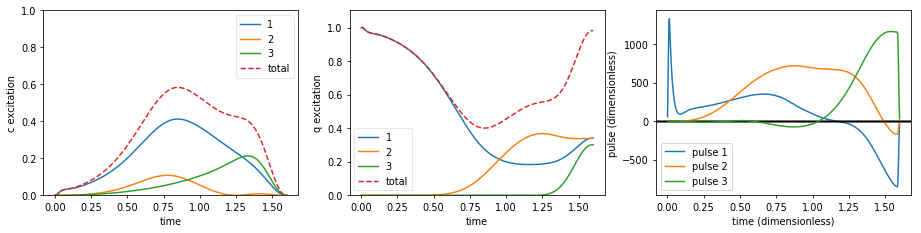

./data/dicke1_QSL_nonherm/rf_3nodes_T1_70


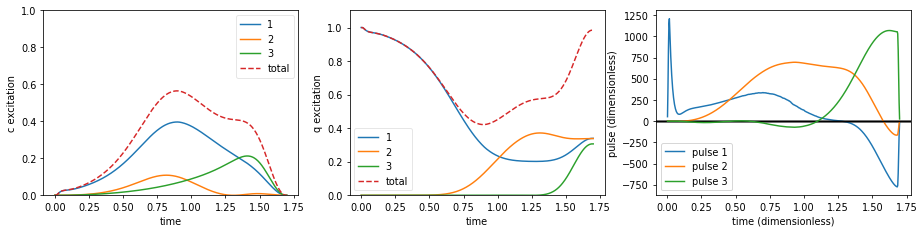

./data/dicke1_QSL_nonherm/rf_3nodes_T1_75


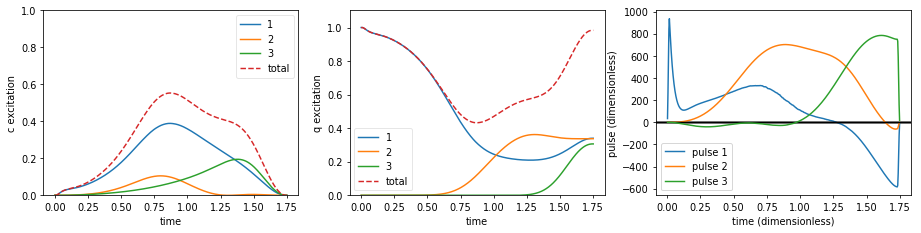

./data/dicke1_QSL_nonherm/rf_3nodes_T1_80


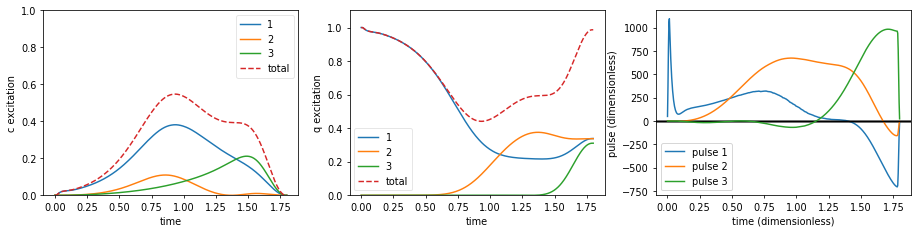

./data/dicke1_QSL_nonherm/rf_3nodes_T1_90


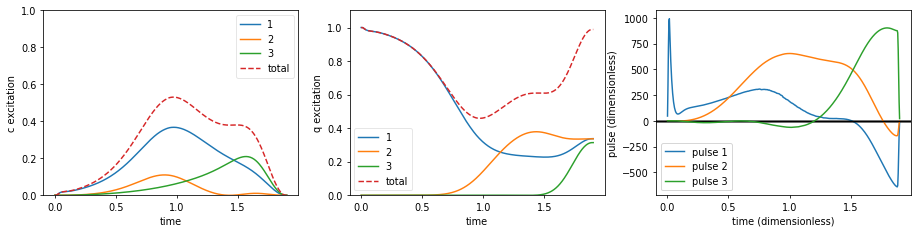

./data/dicke1_QSL_nonherm/rf_3nodes_T2


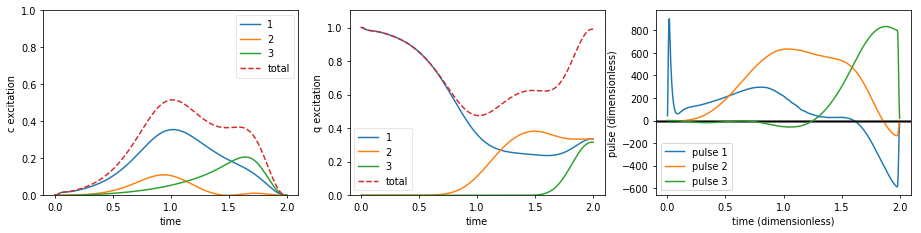

./data/dicke1_QSL_nonherm/rf_3nodes_T2_25


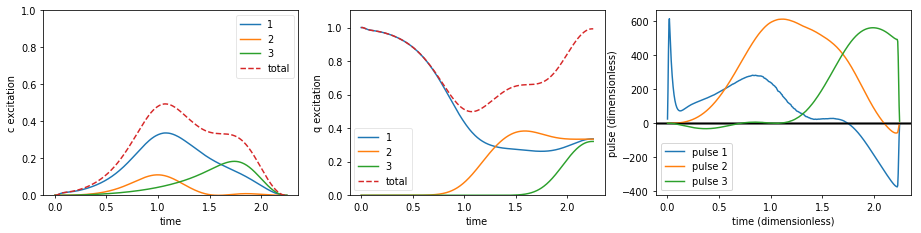

./data/dicke1_QSL_nonherm/rf_3nodes_T2_50


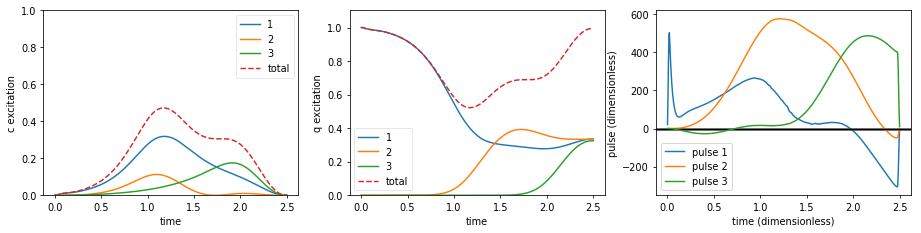

./data/dicke1_QSL_nonherm/rf_3nodes_T3


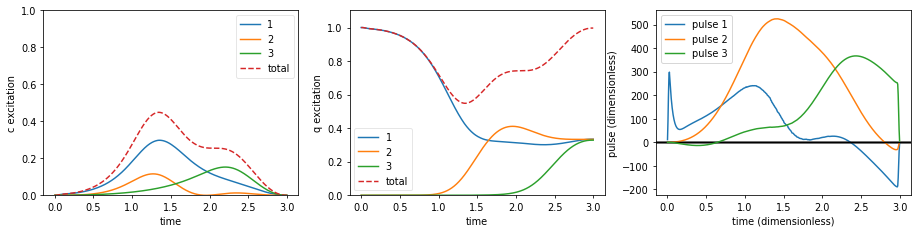

./data/dicke1_QSL_nonherm/rf_3nodes_T4


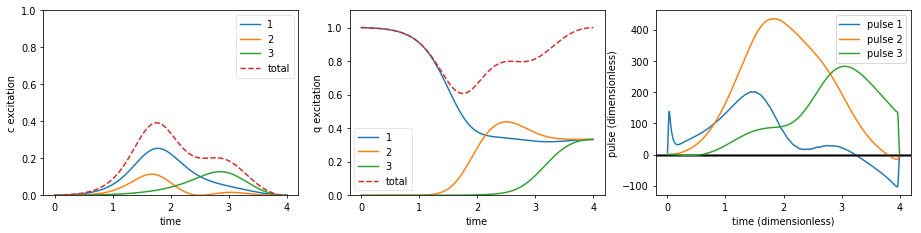

./data/dicke1_QSL_nonherm/rf_3nodes_T5


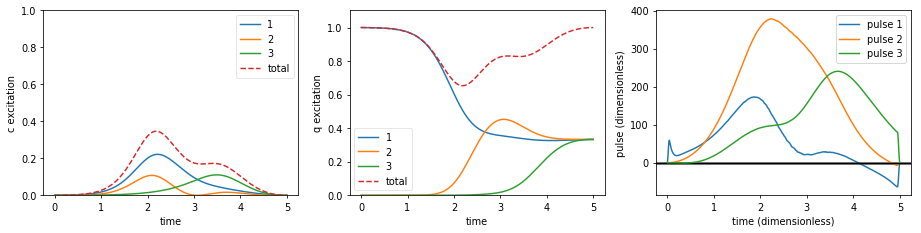

./data/dicke1_QSL_nonherm/rf_3nodes_T8


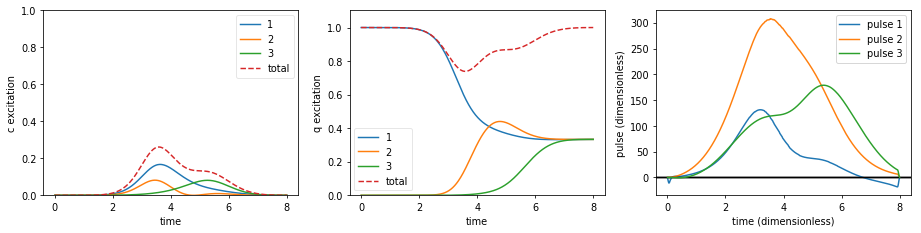

./data/dicke1_QSL_nonherm/rf_3nodes_T9


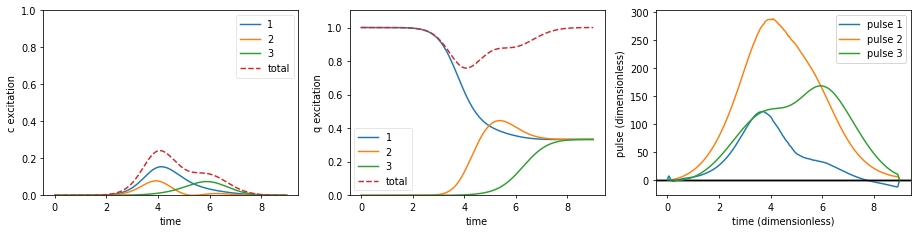

./data/dicke1_QSL_nonherm/rf_3nodes_T10


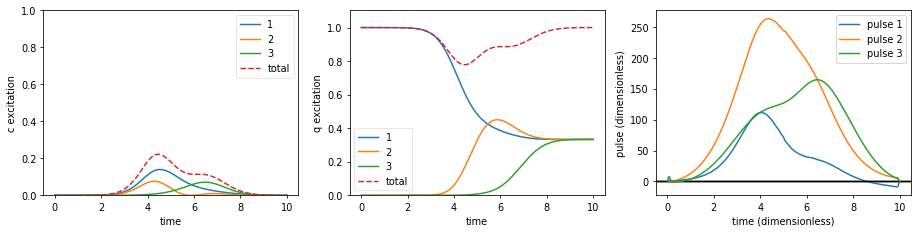

./data/dicke1_QSL_nonherm/rf_3nodes_T15


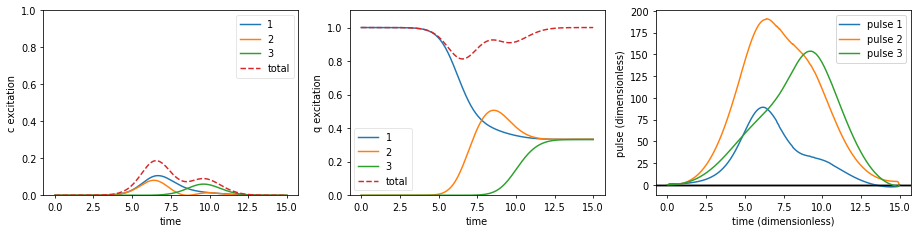

./data/dicke1_QSL_nonherm/rf_3nodes_T20


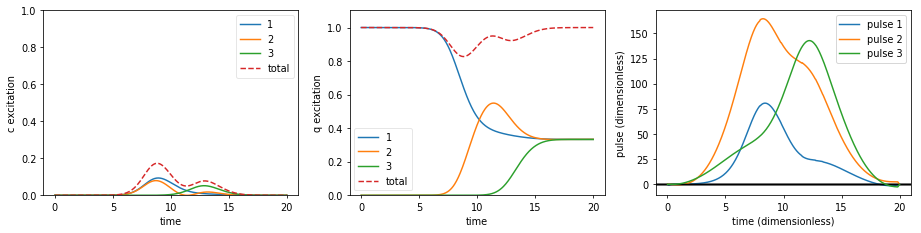

./data/dicke1_QSL_nonherm/rf_3nodes_T50


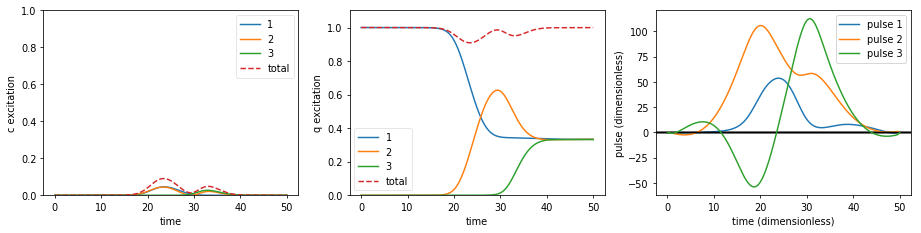

./data/dicke1_QSL_nonherm/rf_3nodes_T70


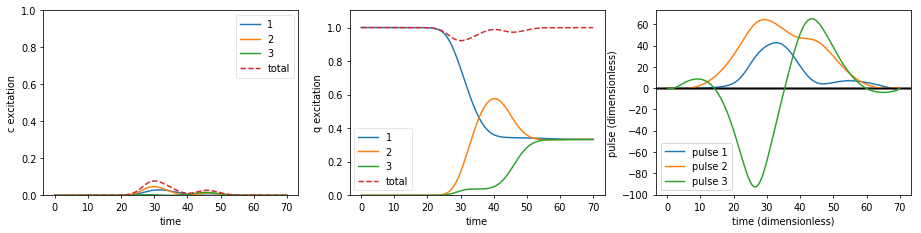

./data/dicke1_QSL_nonherm/rf_4nodes_T0_50


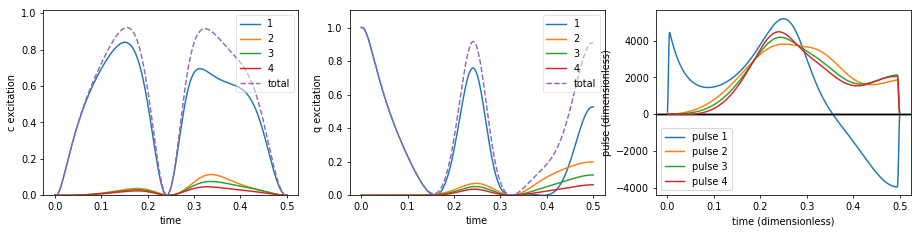

./data/dicke1_QSL_nonherm/rf_4nodes_T0_60


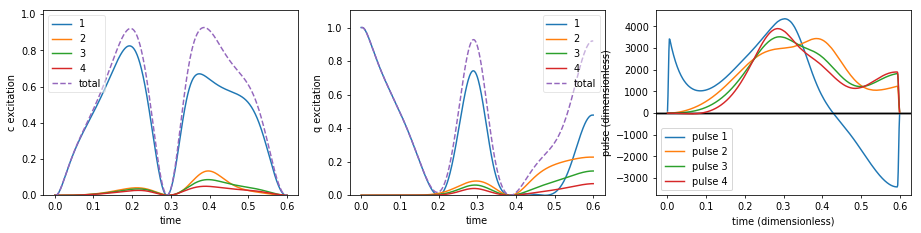

./data/dicke1_QSL_nonherm/rf_4nodes_T0_75


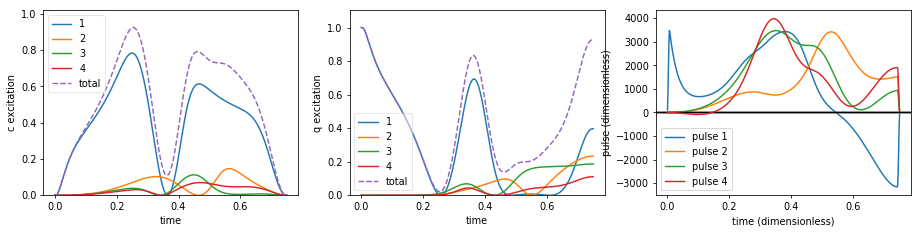

./data/dicke1_QSL_nonherm/rf_4nodes_T0_80


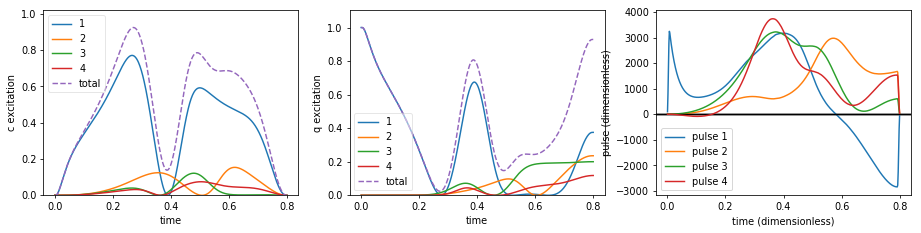

./data/dicke1_QSL_nonherm/rf_4nodes_T0_90


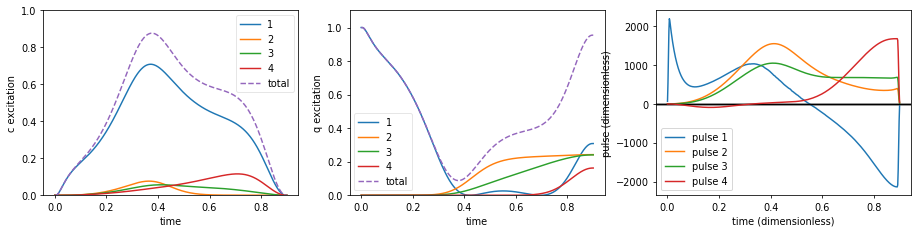

./data/dicke1_QSL_nonherm/rf_4nodes_T1


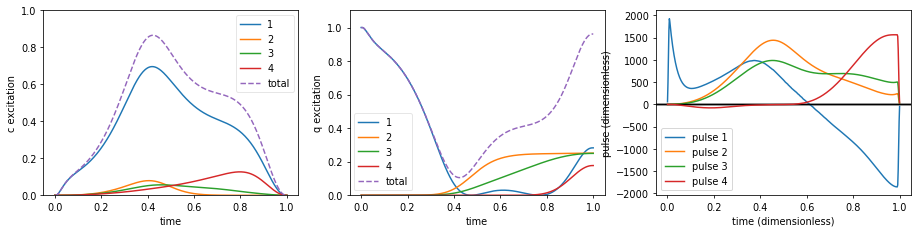

./data/dicke1_QSL_nonherm/rf_4nodes_T1_25


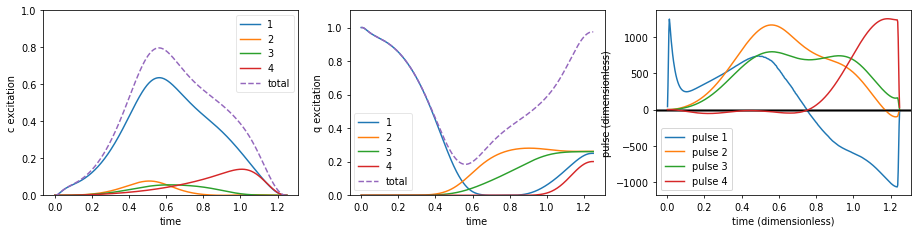

./data/dicke1_QSL_nonherm/rf_4nodes_T1_50


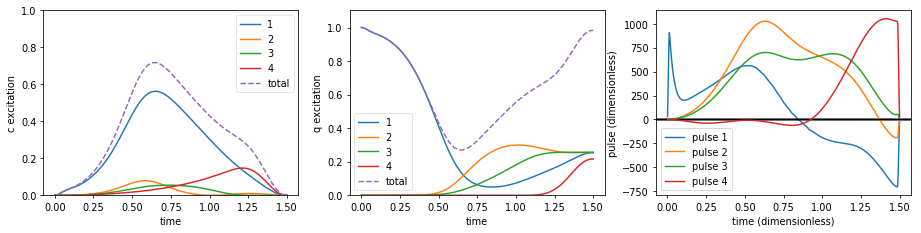

./data/dicke1_QSL_nonherm/rf_4nodes_T1_60


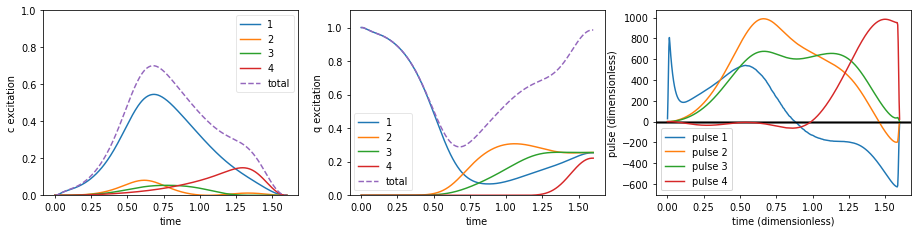

./data/dicke1_QSL_nonherm/rf_4nodes_T1_70


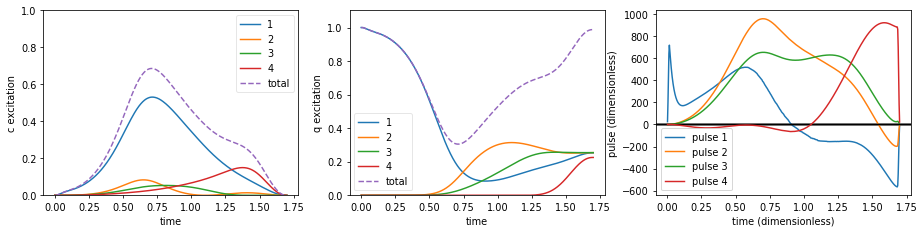

./data/dicke1_QSL_nonherm/rf_4nodes_T1_75


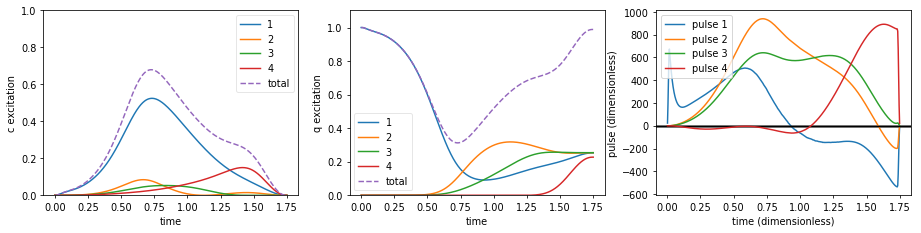

./data/dicke1_QSL_nonherm/rf_4nodes_T1_80


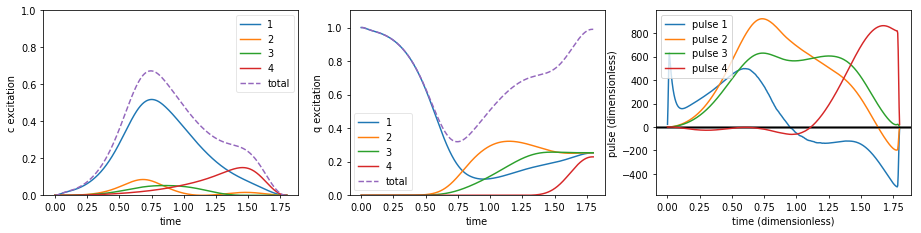

./data/dicke1_QSL_nonherm/rf_4nodes_T1_90


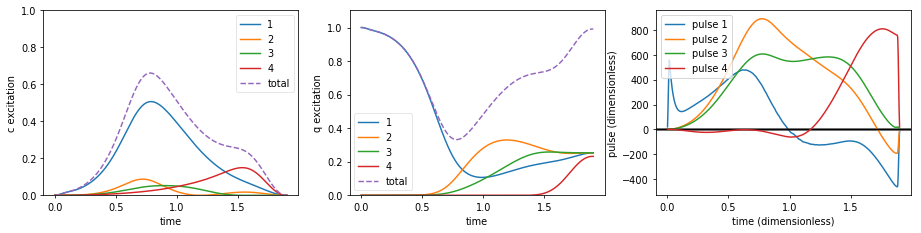

./data/dicke1_QSL_nonherm/rf_4nodes_T2


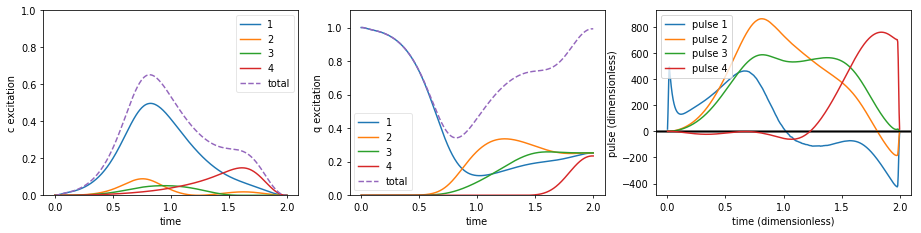

./data/dicke1_QSL_nonherm/rf_4nodes_T2_20


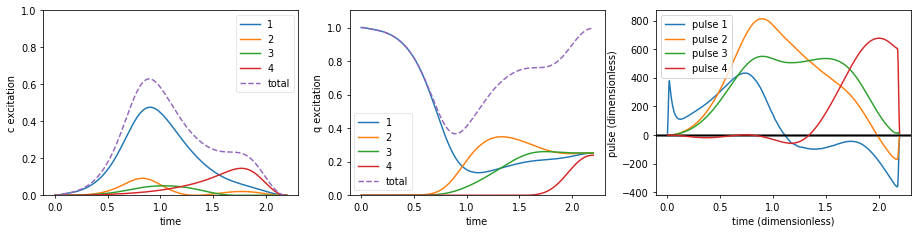

./data/dicke1_QSL_nonherm/rf_4nodes_T2_50


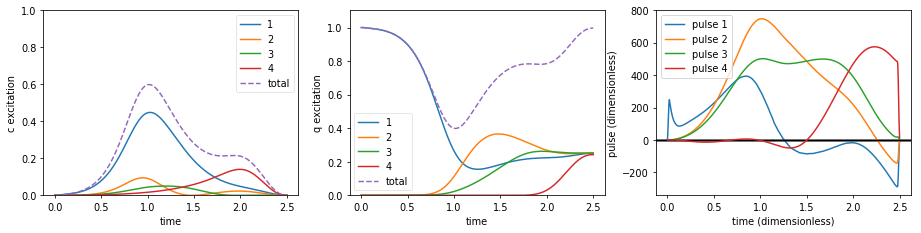

./data/dicke1_QSL_nonherm/rf_4nodes_T3


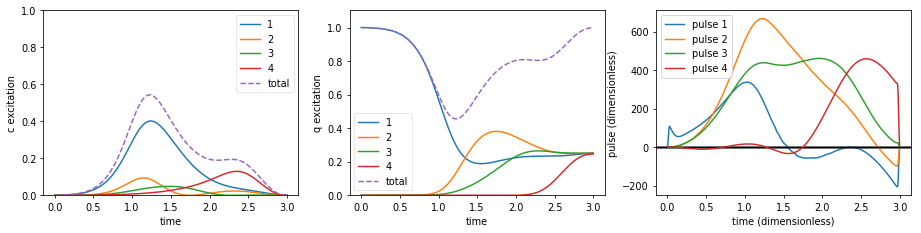

./data/dicke1_QSL_nonherm/rf_4nodes_T4


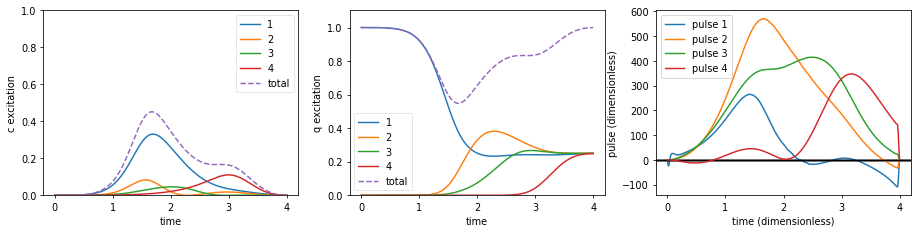

./data/dicke1_QSL_nonherm/rf_4nodes_T5


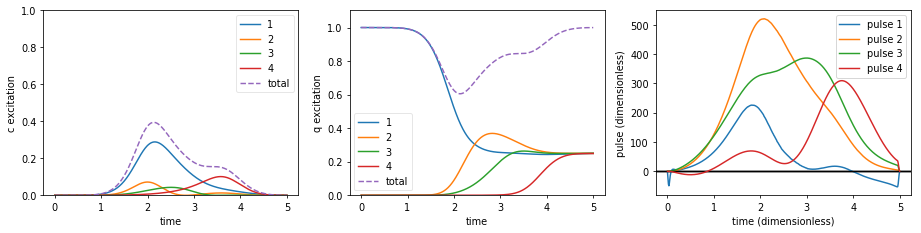

./data/dicke1_QSL_nonherm/rf_4nodes_T6


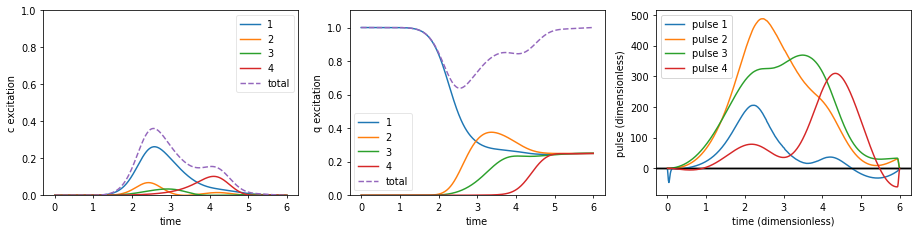

./data/dicke1_QSL_nonherm/rf_4nodes_T7


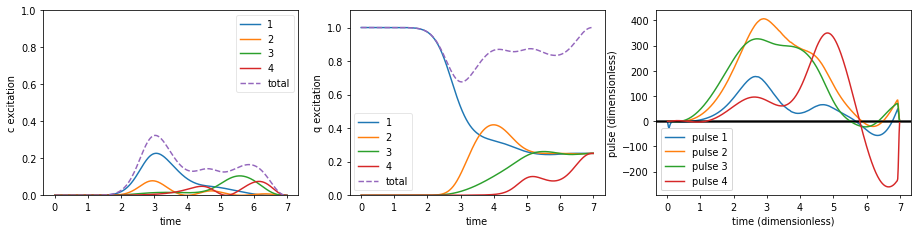

./data/dicke1_QSL_nonherm/rf_4nodes_T8


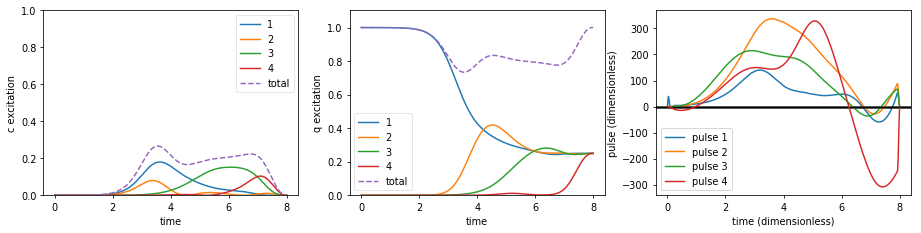

./data/dicke1_QSL_nonherm/rf_4nodes_T9


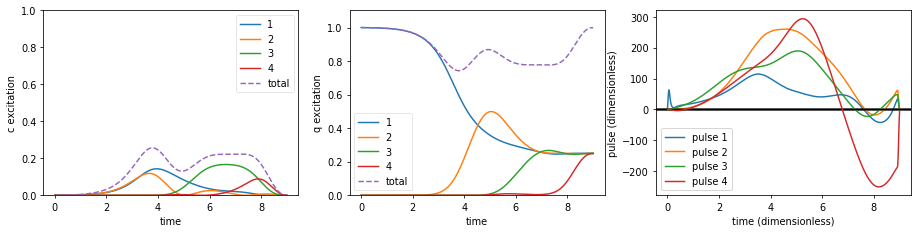

./data/dicke1_QSL_nonherm/rf_4nodes_T10


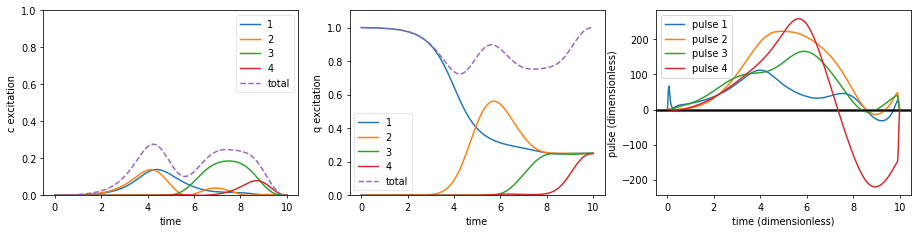

./data/dicke1_QSL_nonherm/rf_4nodes_T15


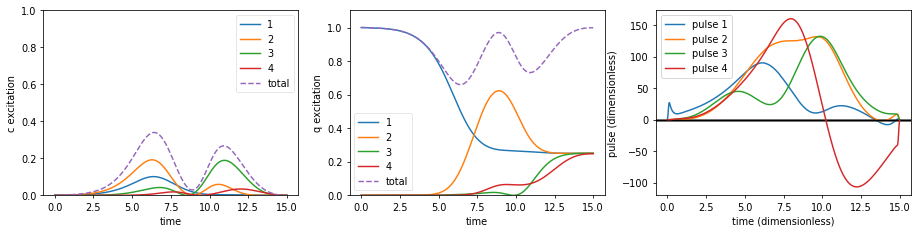

./data/dicke1_QSL_nonherm/rf_4nodes_T20


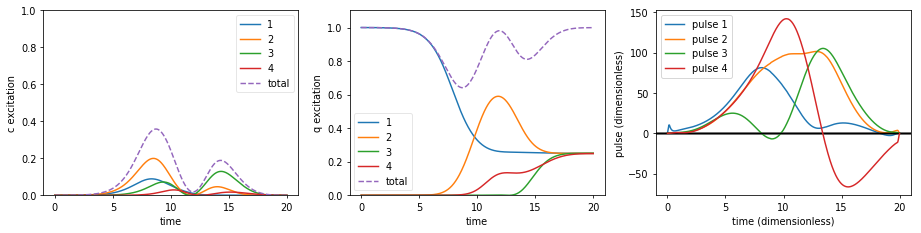

./data/dicke1_QSL_nonherm/rf_4nodes_T50


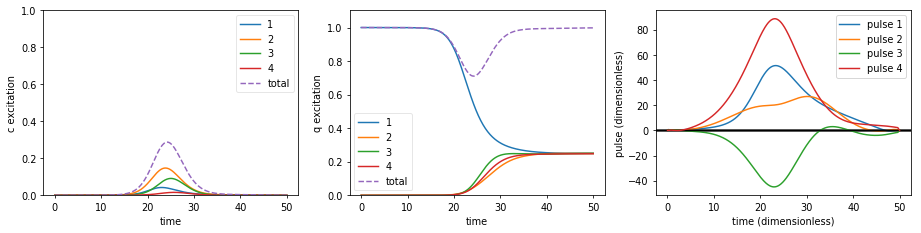

./data/dicke1_QSL_nonherm/rf_4nodes_T70


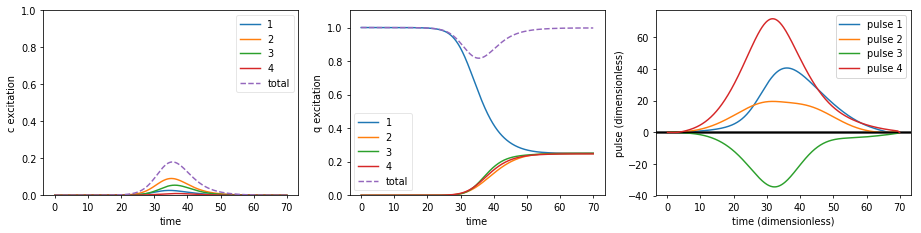

./data/dicke1_QSL_nonherm/rf_5nodes_T0_50


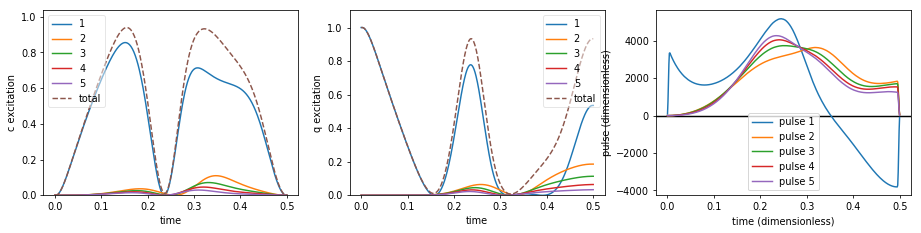

./data/dicke1_QSL_nonherm/rf_5nodes_T0_75


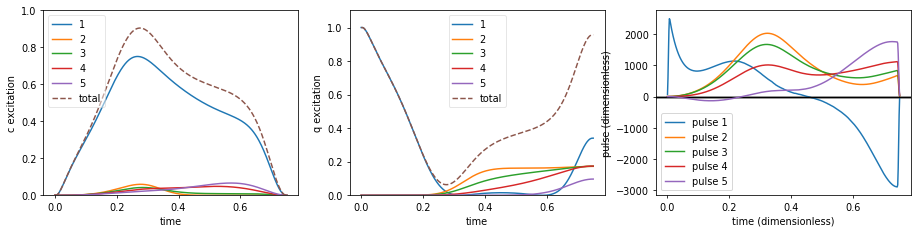

./data/dicke1_QSL_nonherm/rf_5nodes_T1


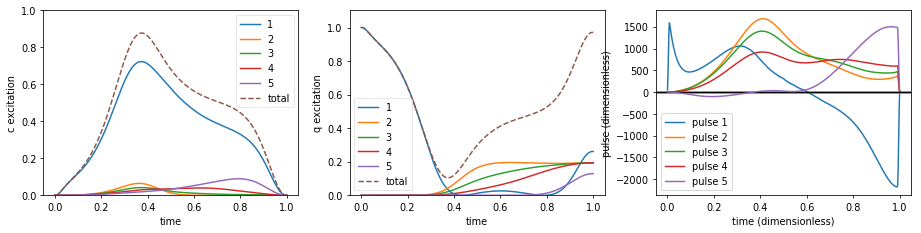

./data/dicke1_QSL_nonherm/rf_5nodes_T1_25


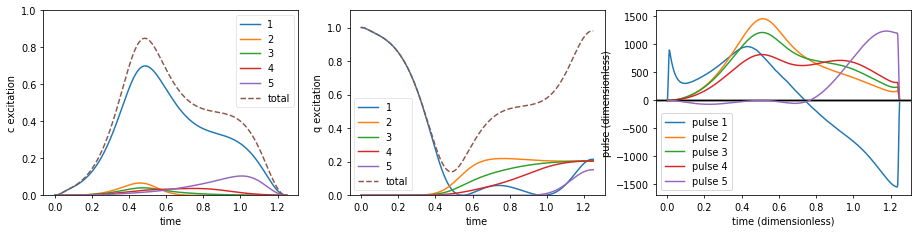

./data/dicke1_QSL_nonherm/rf_5nodes_T1_50


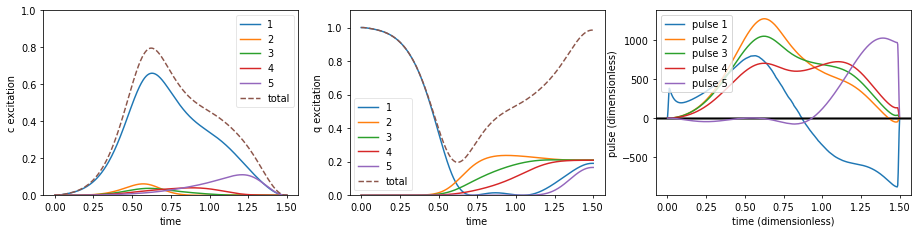

./data/dicke1_QSL_nonherm/rf_5nodes_T1_75


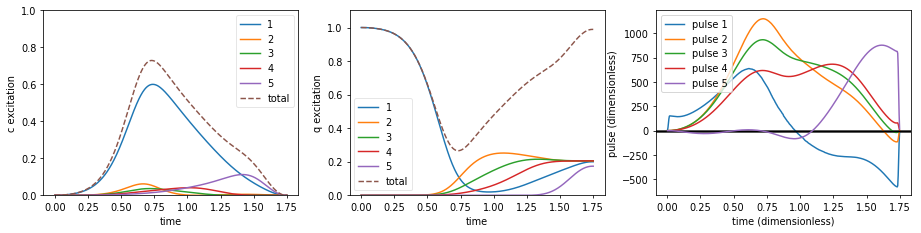

./data/dicke1_QSL_nonherm/rf_5nodes_T2


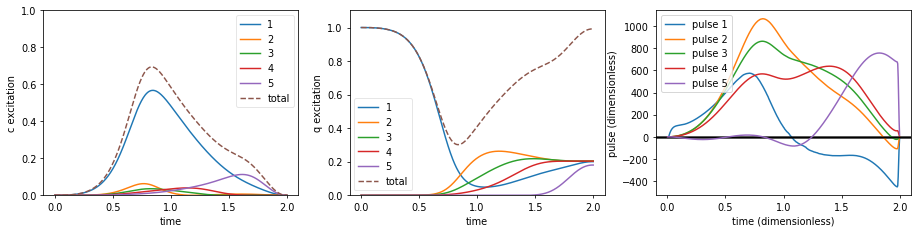

./data/dicke1_QSL_nonherm/rf_5nodes_T2_10


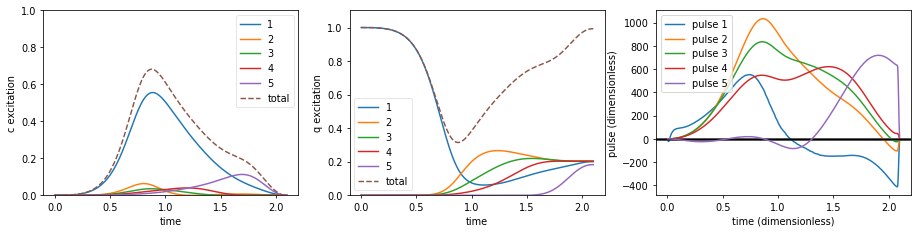

./data/dicke1_QSL_nonherm/rf_5nodes_T2_20


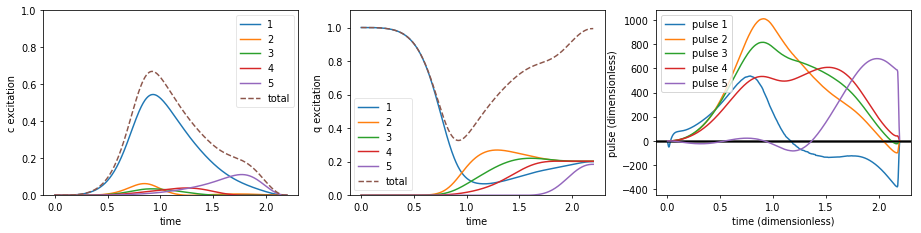

./data/dicke1_QSL_nonherm/rf_5nodes_T2_30


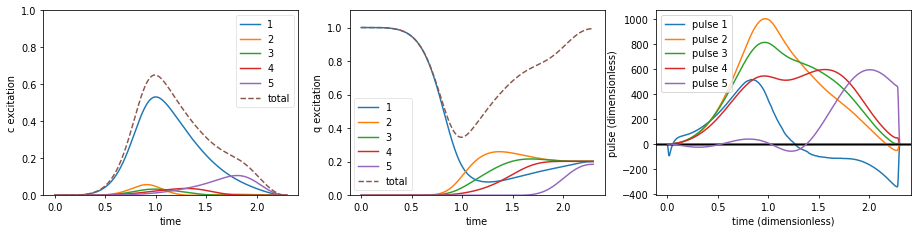

./data/dicke1_QSL_nonherm/rf_5nodes_T2_40


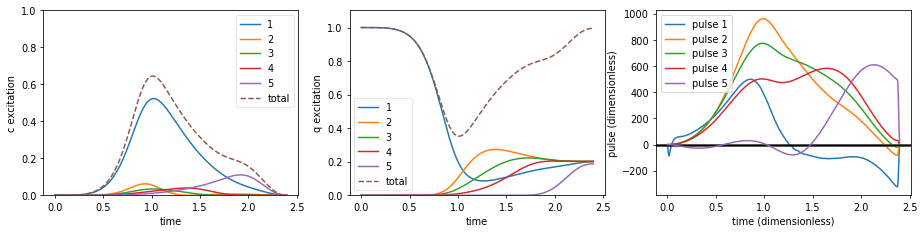

./data/dicke1_QSL_nonherm/rf_5nodes_T2_50


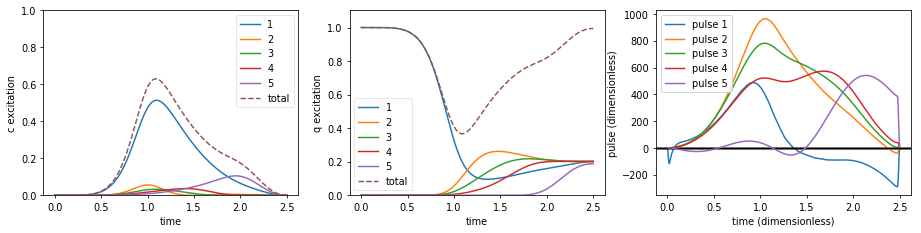

./data/dicke1_QSL_nonherm/rf_5nodes_T2_75


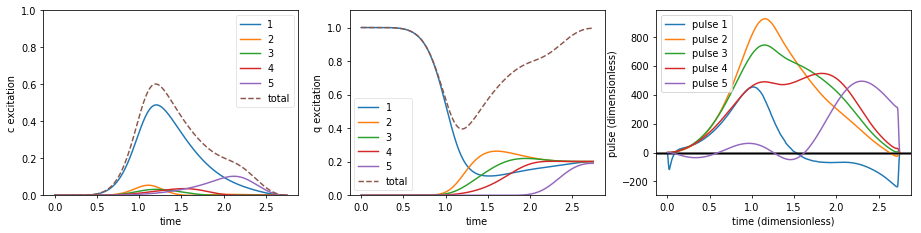

./data/dicke1_QSL_nonherm/rf_5nodes_T3


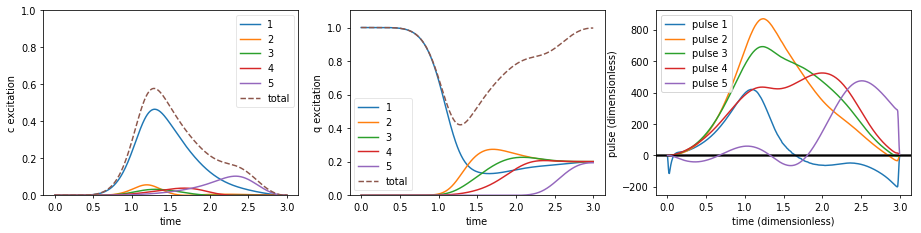

./data/dicke1_QSL_nonherm/rf_5nodes_T4


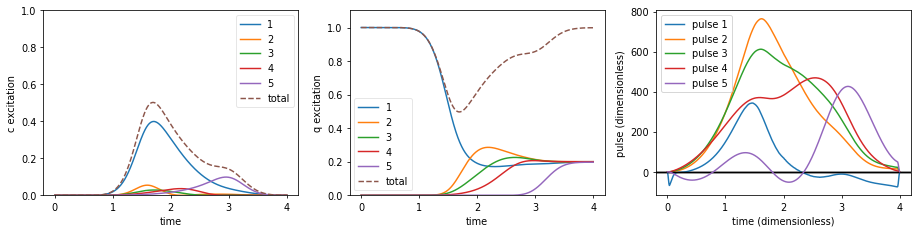

./data/dicke1_QSL_nonherm/rf_5nodes_T5


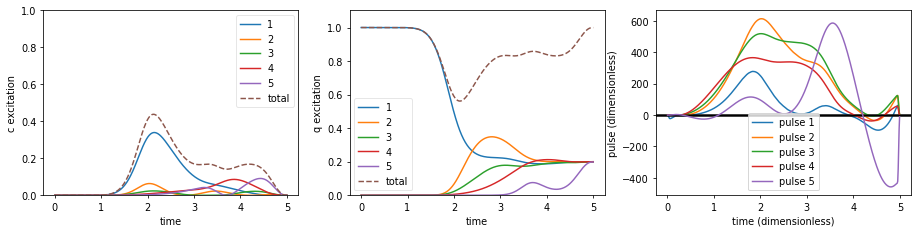

./data/dicke1_QSL_nonherm/rf_5nodes_T6


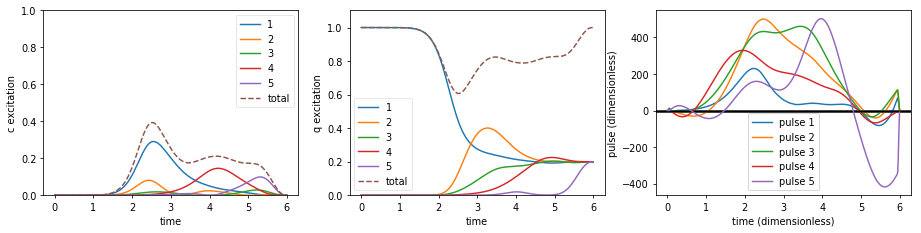

./data/dicke1_QSL_nonherm/rf_5nodes_T7


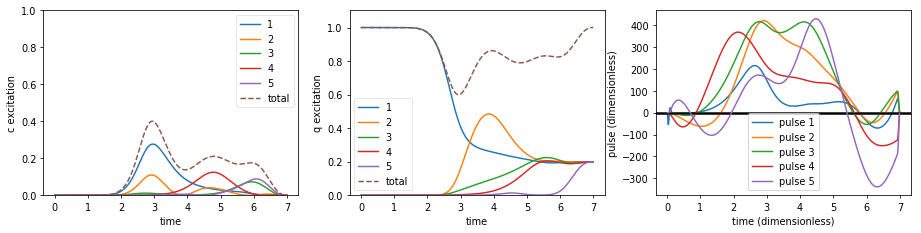

./data/dicke1_QSL_nonherm/rf_5nodes_T8


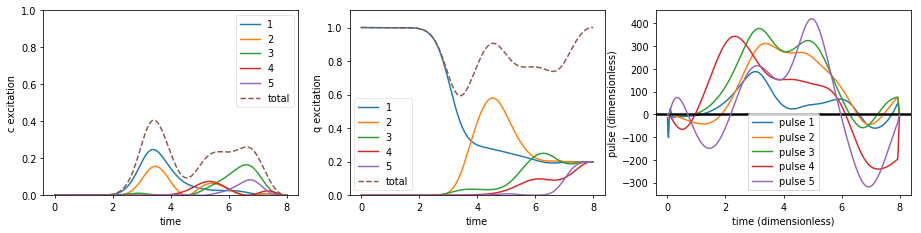

./data/dicke1_QSL_nonherm/rf_5nodes_T9


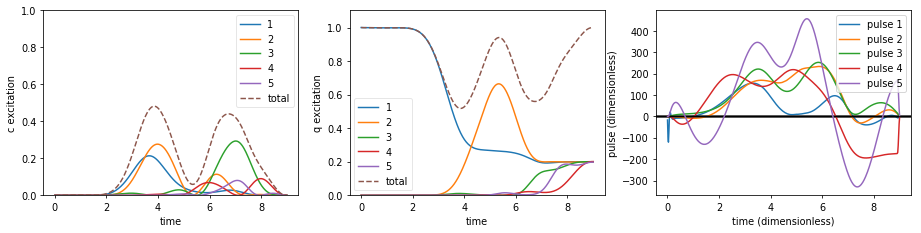

./data/dicke1_QSL_nonherm/rf_5nodes_T10


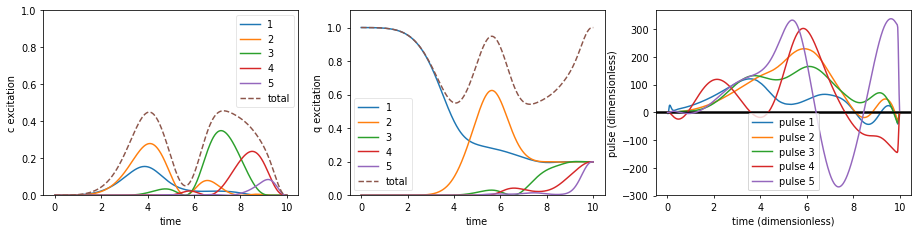

./data/dicke1_QSL_nonherm/rf_5nodes_T12


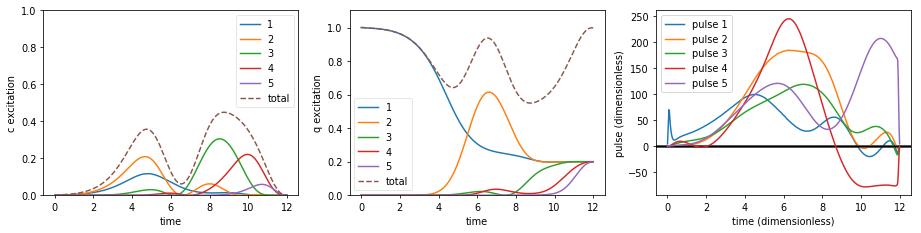

./data/dicke1_QSL_nonherm/rf_5nodes_T15


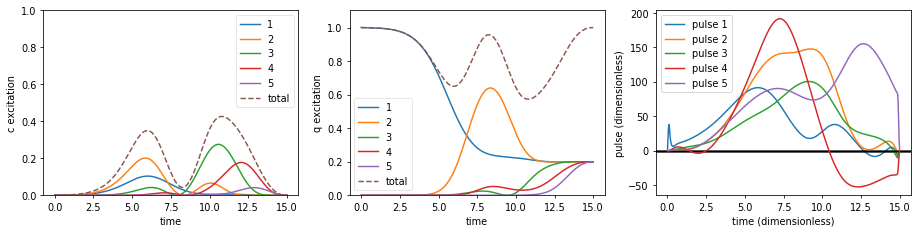

./data/dicke1_QSL_nonherm/rf_5nodes_T18


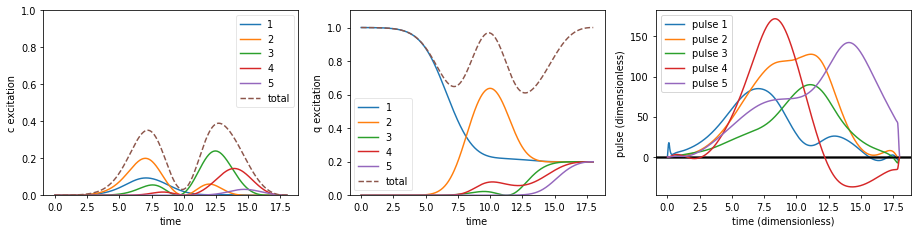

./data/dicke1_QSL_nonherm/rf_5nodes_T20


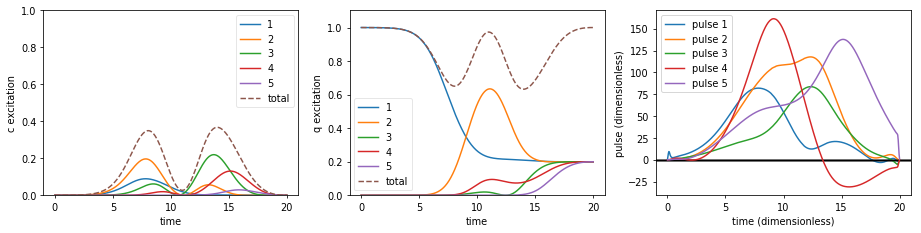

./data/dicke1_QSL_nonherm/rf_5nodes_T50


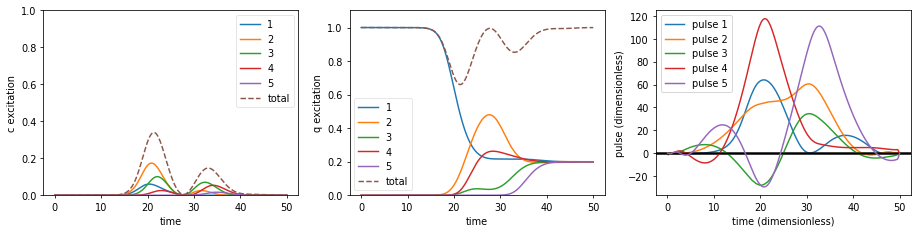

./data/dicke1_QSL_nonherm/rf_5nodes_T70


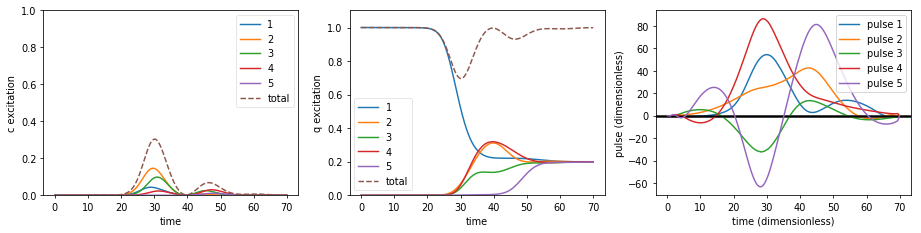

./data/dicke1_QSL_nonherm/rf_6nodes_T0_50


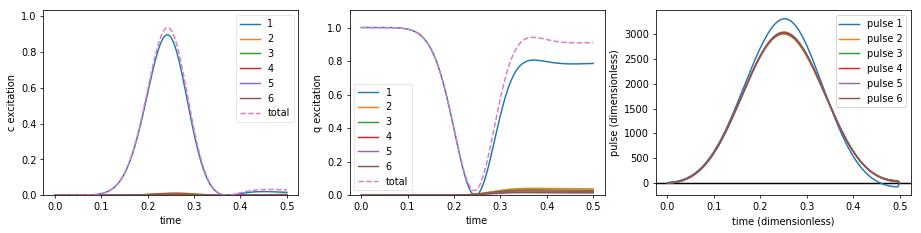

./data/dicke1_QSL_nonherm/rf_6nodes_T0_60


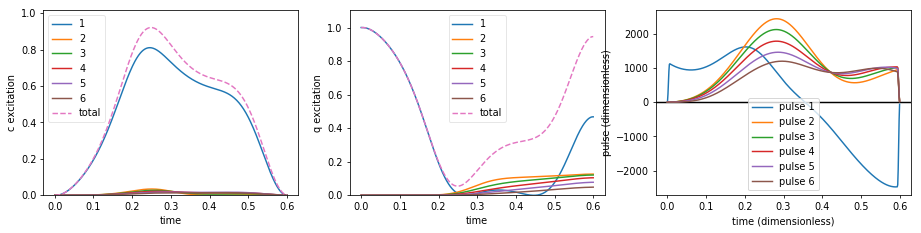

./data/dicke1_QSL_nonherm/rf_6nodes_T0_75


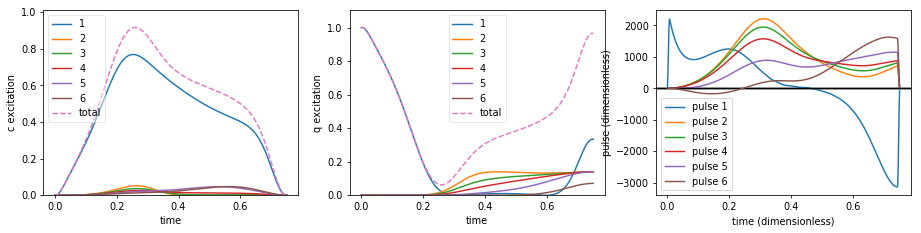

./data/dicke1_QSL_nonherm/rf_6nodes_T0_80


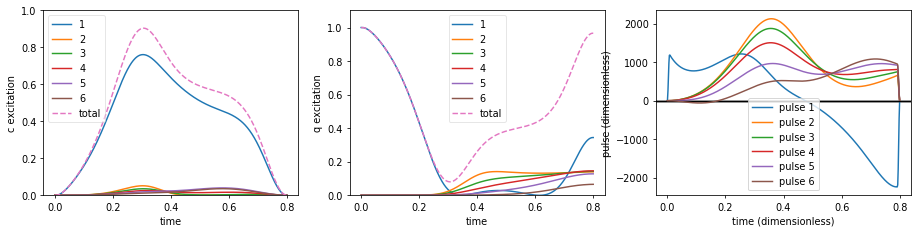

./data/dicke1_QSL_nonherm/rf_6nodes_T0_90


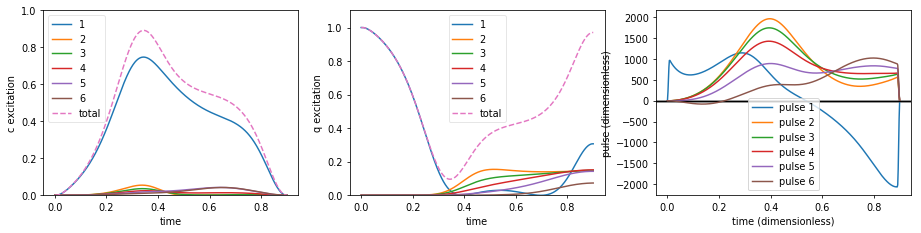

./data/dicke1_QSL_nonherm/rf_6nodes_T1


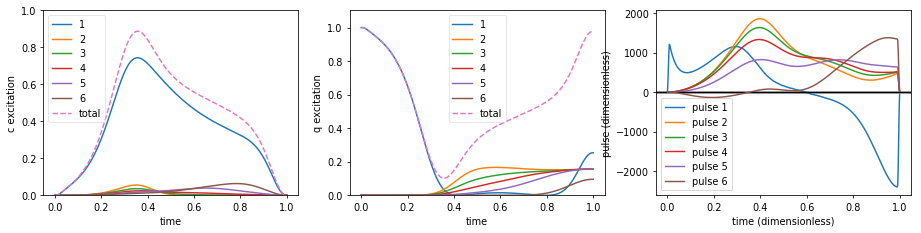

./data/dicke1_QSL_nonherm/rf_6nodes_T1_25


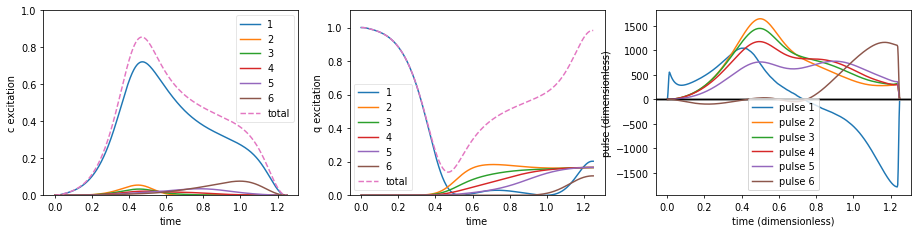

./data/dicke1_QSL_nonherm/rf_6nodes_T1_50


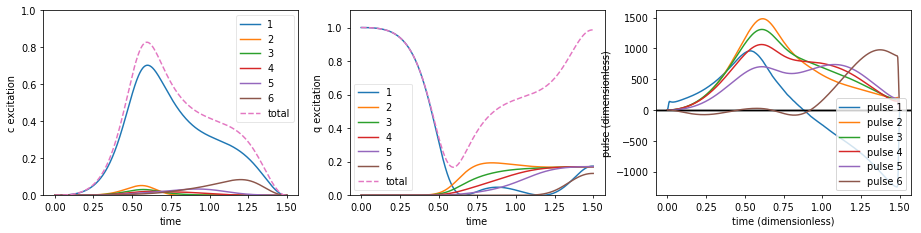

./data/dicke1_QSL_nonherm/rf_6nodes_T1_75


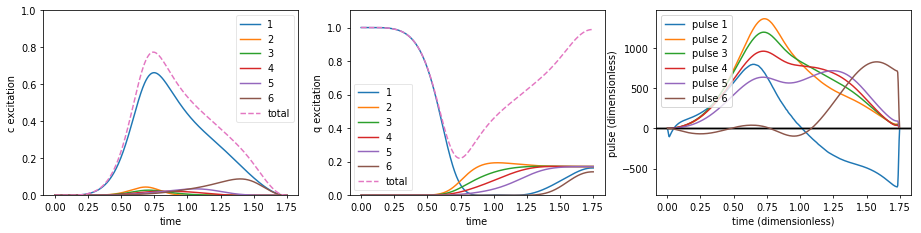

./data/dicke1_QSL_nonherm/rf_6nodes_T2


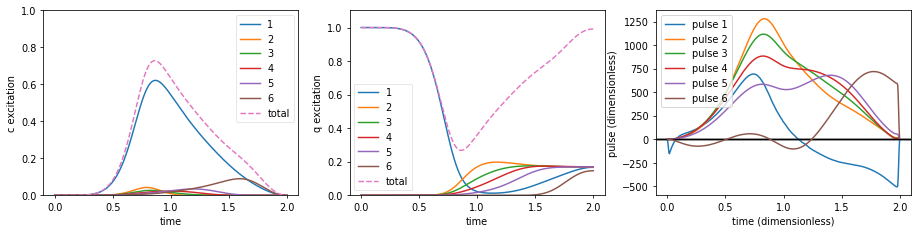

./data/dicke1_QSL_nonherm/rf_6nodes_T2_50


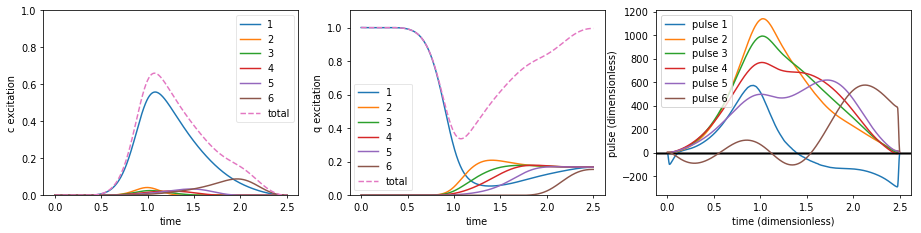

./data/dicke1_QSL_nonherm/rf_6nodes_T3


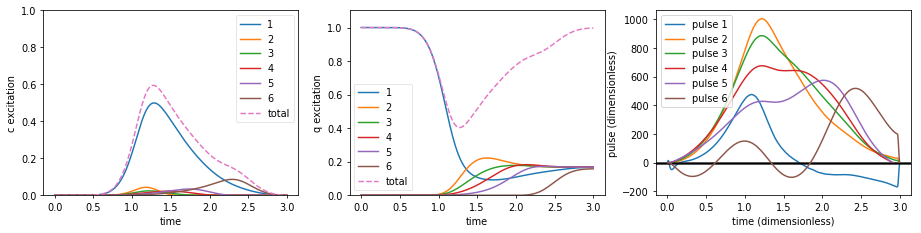

./data/dicke1_QSL_nonherm/rf_6nodes_T3_10


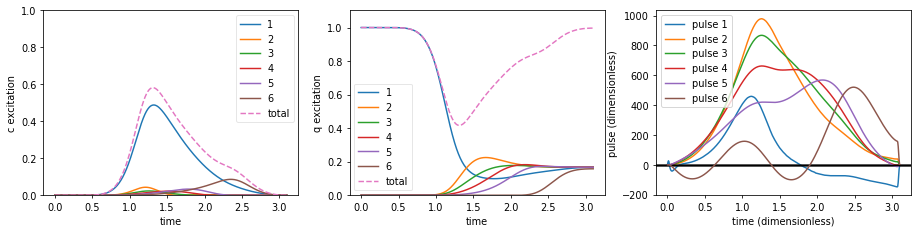

./data/dicke1_QSL_nonherm/rf_6nodes_T3_20


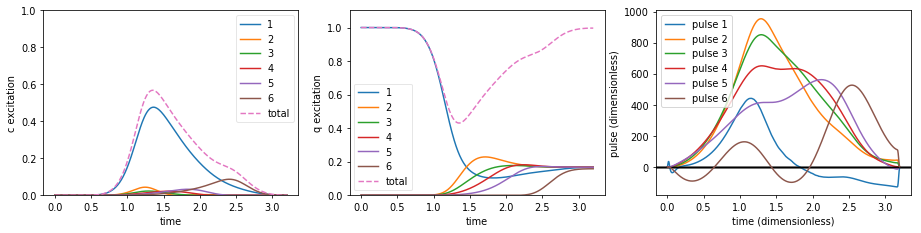

./data/dicke1_QSL_nonherm/rf_6nodes_T3_25


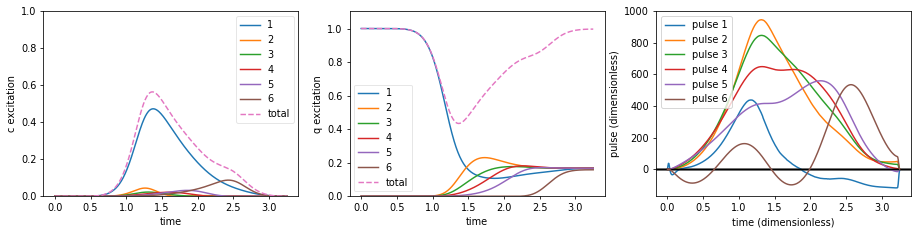

./data/dicke1_QSL_nonherm/rf_6nodes_T3_30


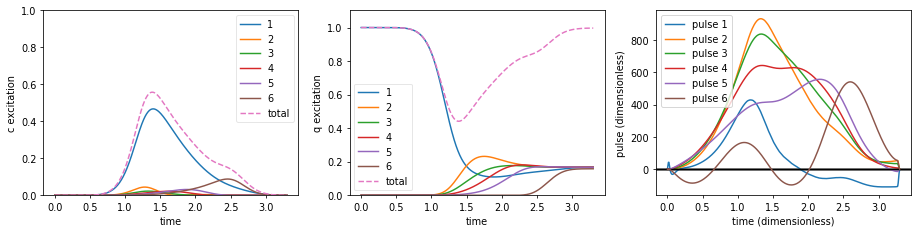

./data/dicke1_QSL_nonherm/rf_6nodes_T3_40


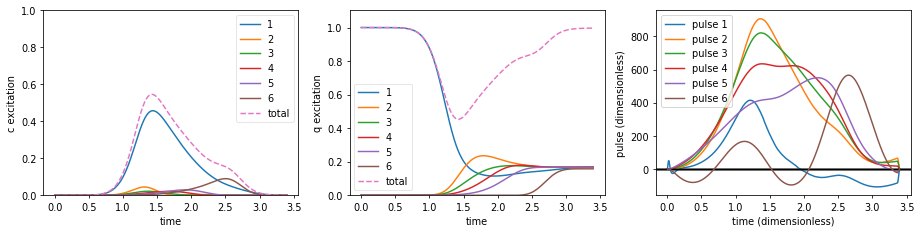

./data/dicke1_QSL_nonherm/rf_6nodes_T3_50


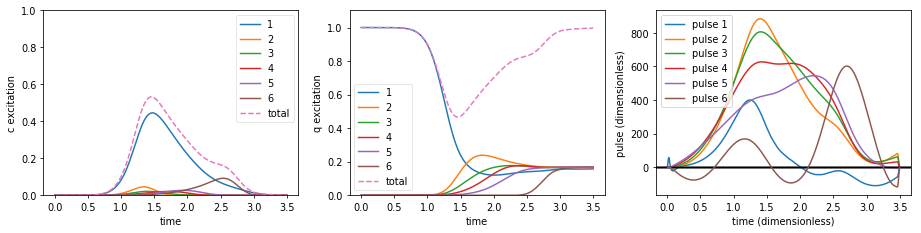

./data/dicke1_QSL_nonherm/rf_6nodes_T4


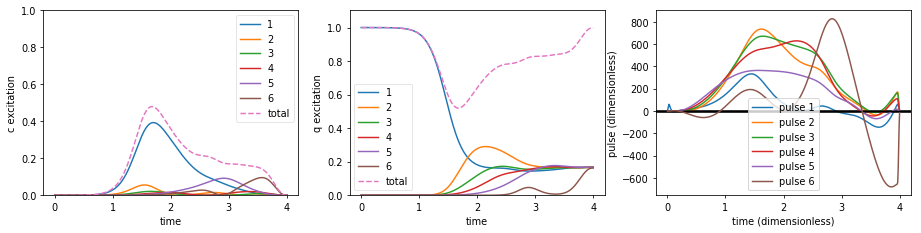

./data/dicke1_QSL_nonherm/rf_6nodes_T4_50


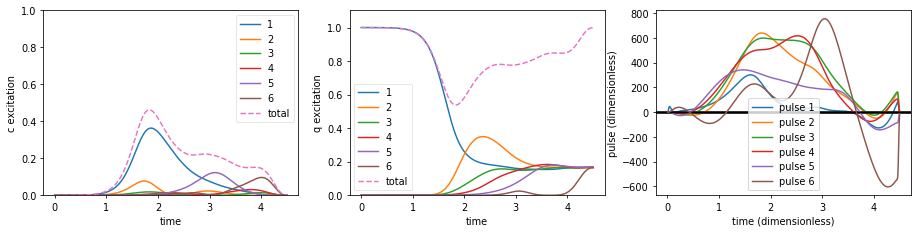

./data/dicke1_QSL_nonherm/rf_6nodes_T5


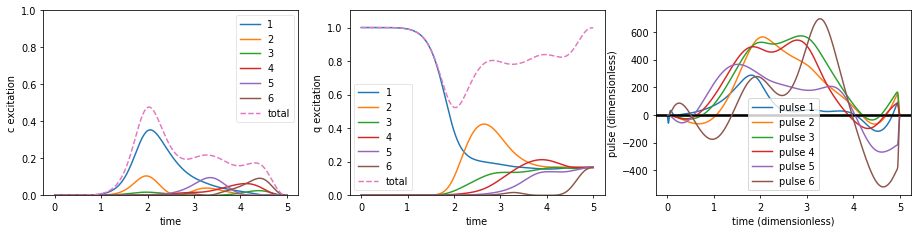

./data/dicke1_QSL_nonherm/rf_6nodes_T5_50


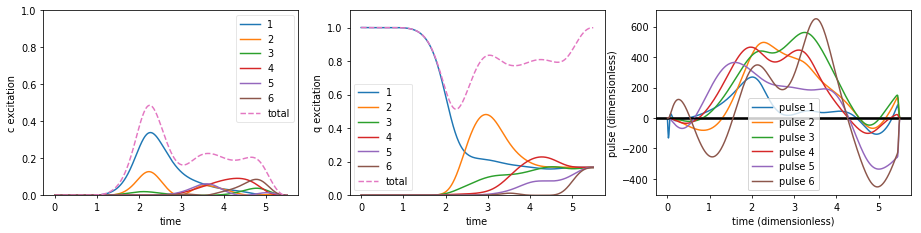

./data/dicke1_QSL_nonherm/rf_6nodes_T6


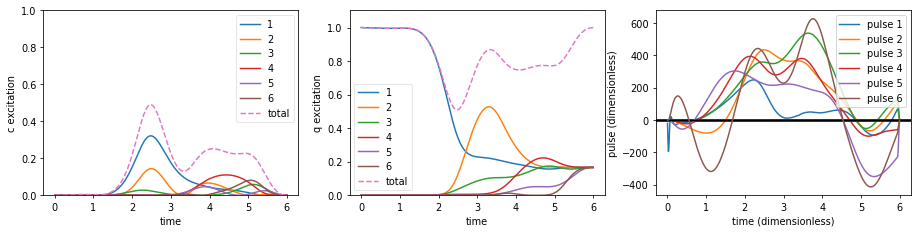

./data/dicke1_QSL_nonherm/rf_6nodes_T7


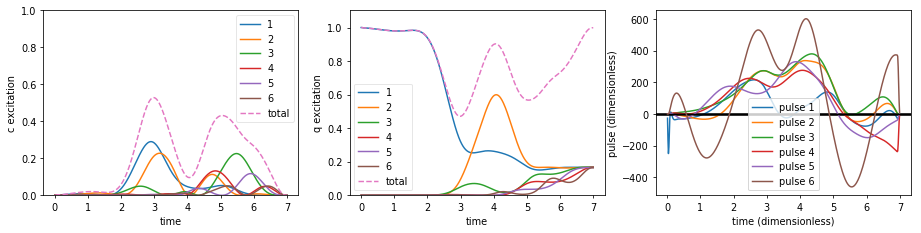

./data/dicke1_QSL_nonherm/rf_6nodes_T8


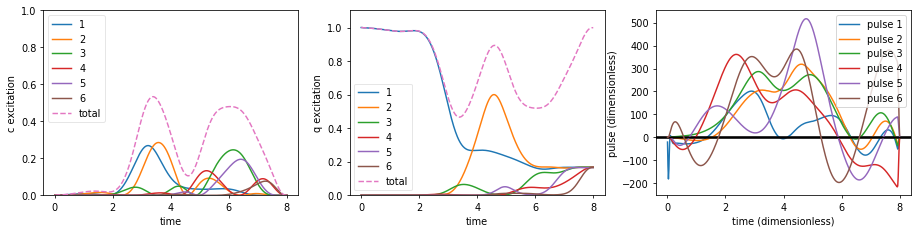

./data/dicke1_QSL_nonherm/rf_6nodes_T9


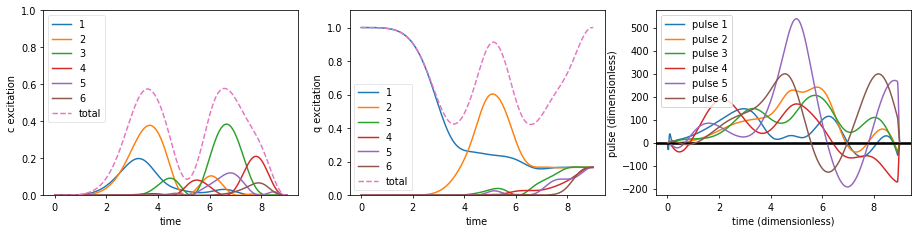

./data/dicke1_QSL_nonherm/rf_6nodes_T10


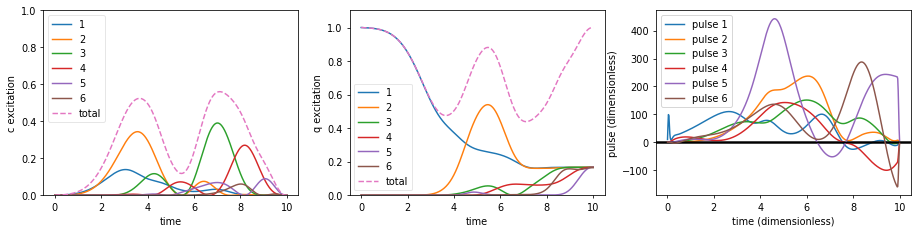

./data/dicke1_QSL_nonherm/rf_6nodes_T12


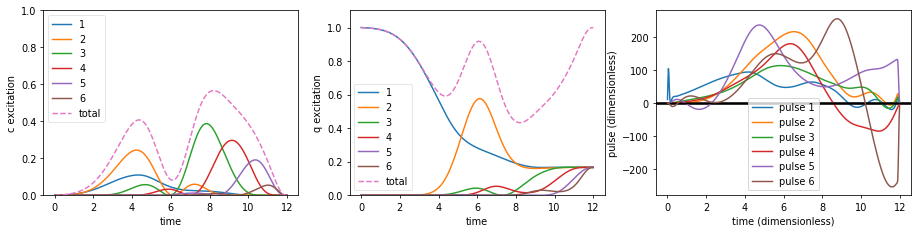

./data/dicke1_QSL_nonherm/rf_6nodes_T14


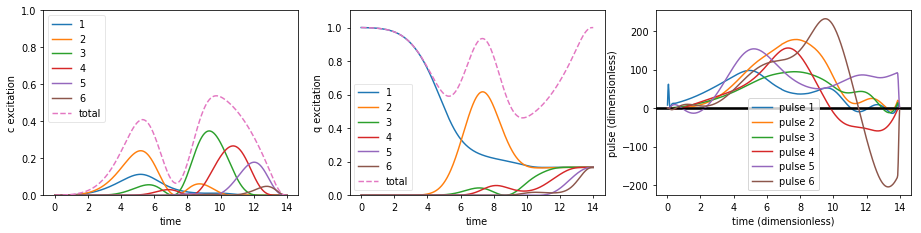

./data/dicke1_QSL_nonherm/rf_6nodes_T15


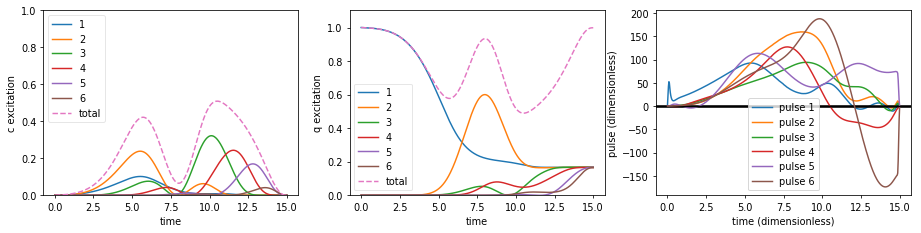

./data/dicke1_QSL_nonherm/rf_6nodes_T18


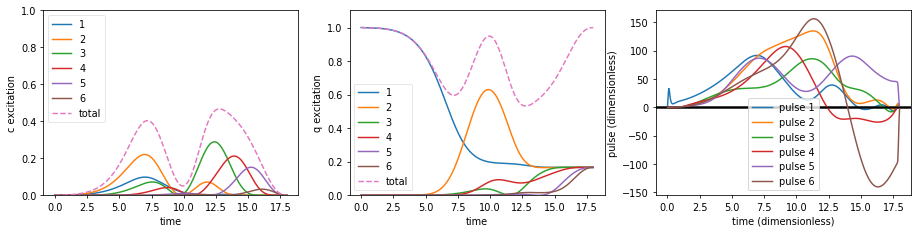

./data/dicke1_QSL_nonherm/rf_6nodes_T20


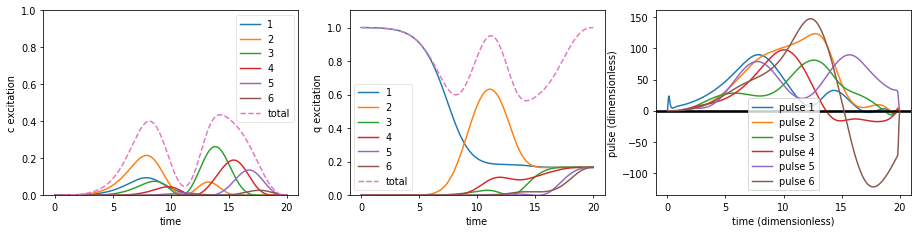

./data/dicke1_QSL_nonherm/rf_6nodes_T50


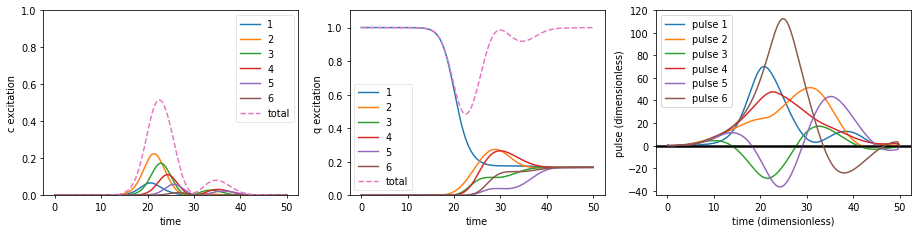

./data/dicke1_QSL_nonherm/rf_6nodes_T70


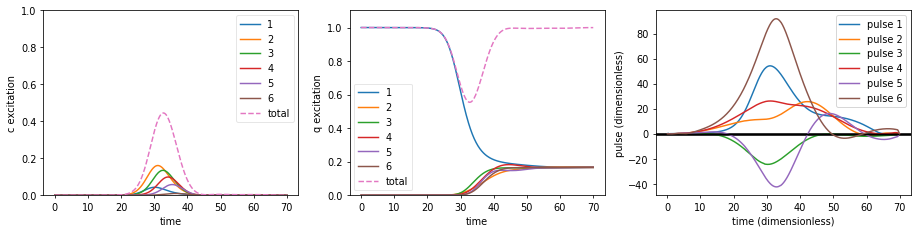

./data/dicke1_QSL_nonherm/rf_7nodes_T1


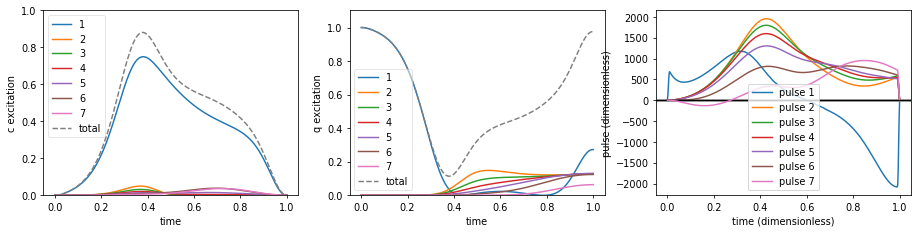

./data/dicke1_QSL_nonherm/rf_7nodes_T1_50


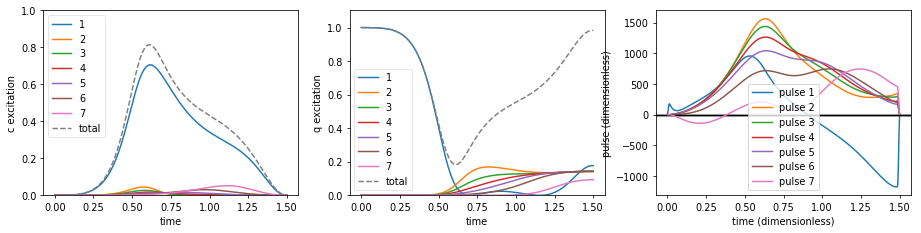

./data/dicke1_QSL_nonherm/rf_7nodes_T1_75


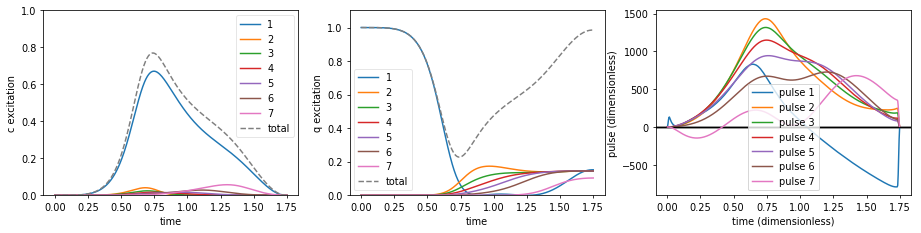

./data/dicke1_QSL_nonherm/rf_7nodes_T2


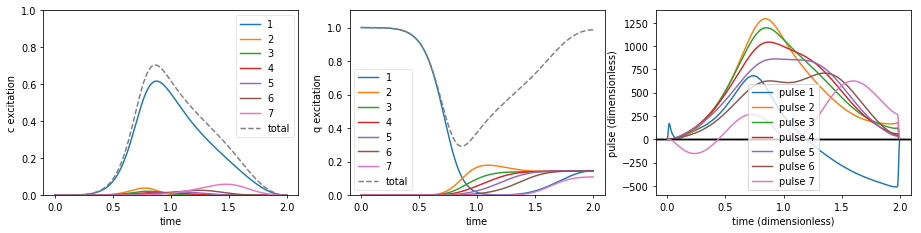

./data/dicke1_QSL_nonherm/rf_7nodes_T2_50


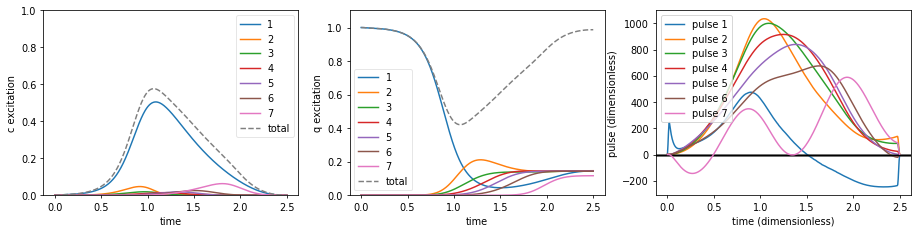

./data/dicke1_QSL_nonherm/rf_7nodes_T3


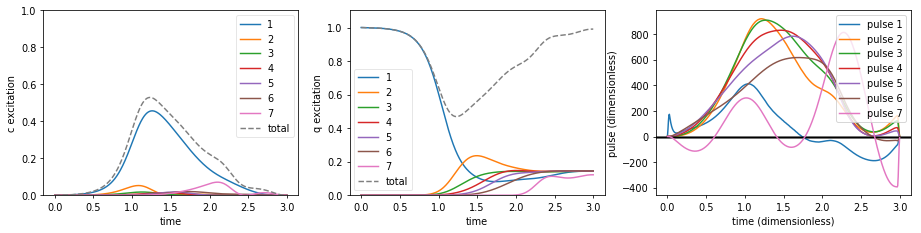

./data/dicke1_QSL_nonherm/rf_7nodes_T3_50


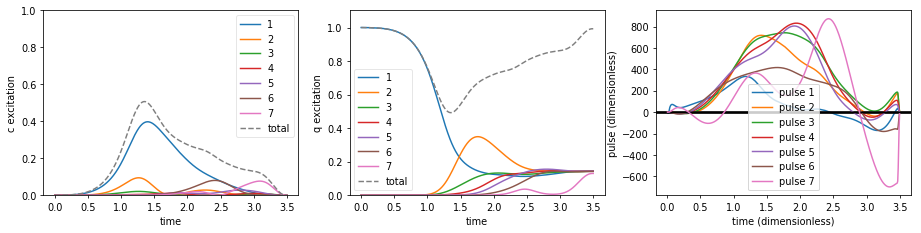

./data/dicke1_QSL_nonherm/rf_7nodes_T4


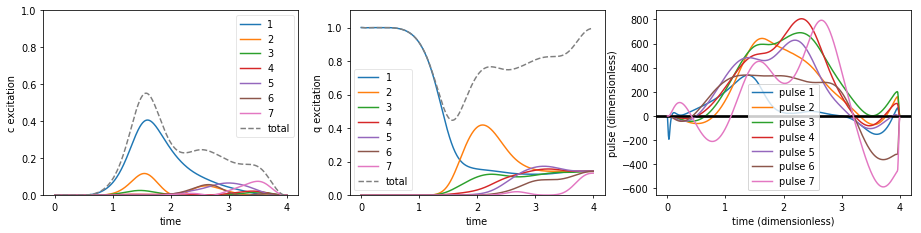

./data/dicke1_QSL_nonherm/rf_7nodes_T4_50


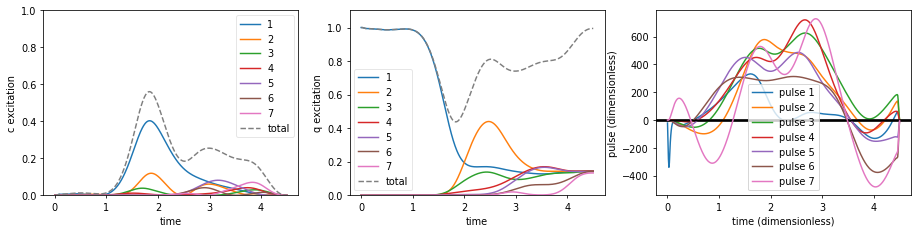

./data/dicke1_QSL_nonherm/rf_7nodes_T5


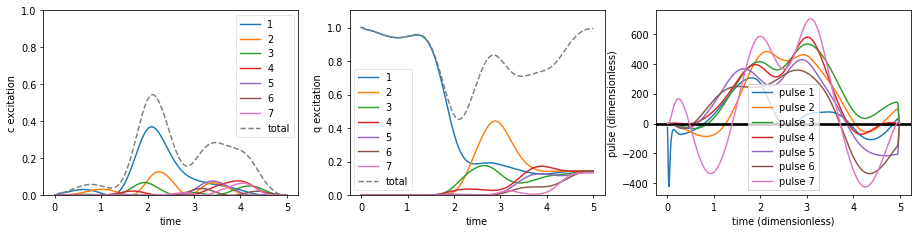

./data/dicke1_QSL_nonherm/rf_7nodes_T5_50


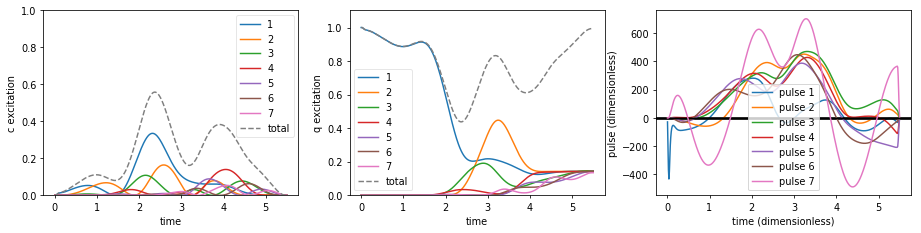

./data/dicke1_QSL_nonherm/rf_7nodes_T6


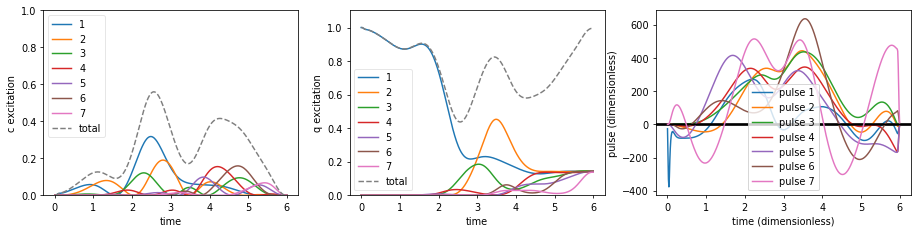

./data/dicke1_QSL_nonherm/rf_7nodes_T7


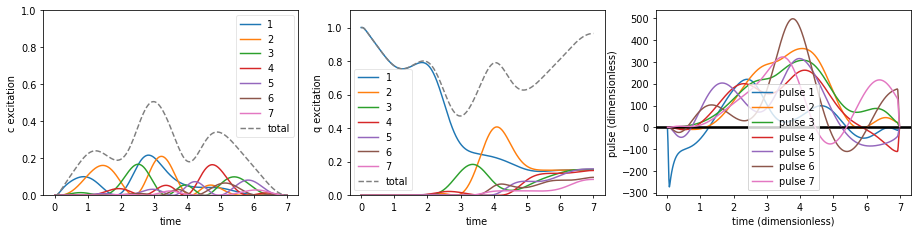

./data/dicke1_QSL_nonherm/rf_7nodes_T8


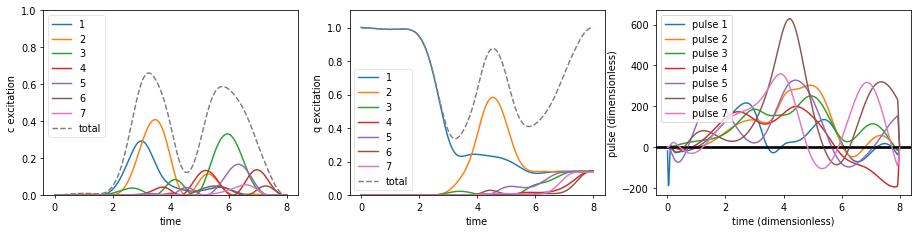

./data/dicke1_QSL_nonherm/rf_7nodes_T9


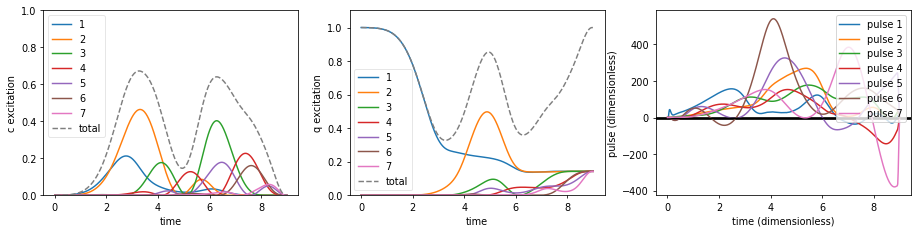

./data/dicke1_QSL_nonherm/rf_7nodes_T10


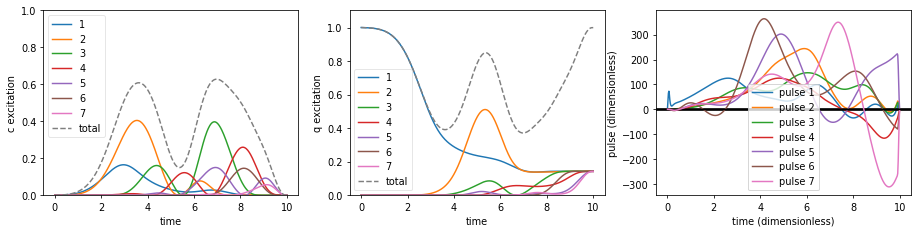

./data/dicke1_QSL_nonherm/rf_7nodes_T12


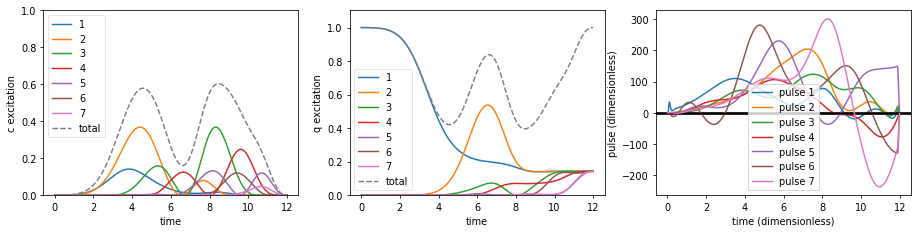

./data/dicke1_QSL_nonherm/rf_7nodes_T14


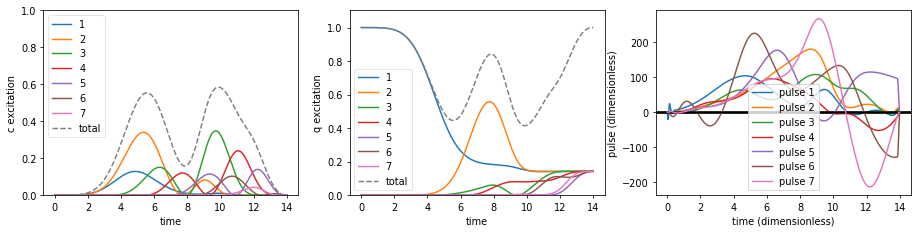

./data/dicke1_QSL_nonherm/rf_7nodes_T15


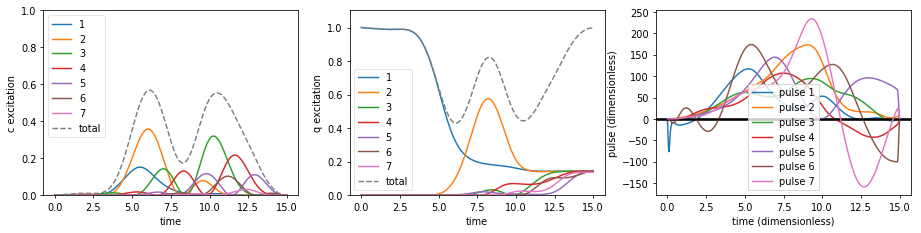

./data/dicke1_QSL_nonherm/rf_8nodes_T10


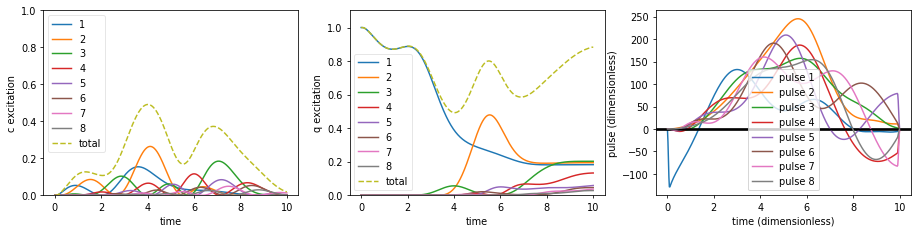

In [17]:
for rf in TABLE['rf']:
    print(rf)
    show_summary_dicke(rf)